#INSA Toulouse - Génie Mathématique et Modélisation - 5A

# **High-Dimensional-Deep-Learning**
# **Mini-projet n° 1 – Qui a peint ce tableau ?**

Mai Dinh Nam  &  El Ghali Berqoq EL Alami

Ce premier mini-projet a pour objectif de développer et d’entraîner un modèle capable de relever le défi proposé par le site artchallenge.ru : Qui a peint ce tableau ?.

Notre démarche débutera par une **analyse exploratoire** critique du jeu de données "Art Challenge" afin d’identifier les particularités des œuvres et des artistes. Ensuite, nous détaillerons :
les critères de sélection des images utilisées pour nos expériences, les choix de modèles de réseaux de neurones adaptés à la problématique et les méthodes d’entraînement et d’évaluation mises en place.

# 0. Analyse exploratoire des données :

In [2]:
#importer les librairies nécessaires
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
from PIL import Image
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelBinarizer
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import os
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau
from sklearn.metrics import confusion_matrix
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, GlobalAveragePooling2D, Dense, Dropout, BatchNormalization, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.layers import Input

In [64]:
#Les données sur artistes :
url = "https://plmlab.math.cnrs.fr/chevallier-teaching/datasets/art-challenge/-/raw/main/artists.csv"
artists_df = pd.read_csv(url)
print(artists_df.head())

   id                name        years                         genre  \
0   0   Amedeo Modigliani  1884 - 1920                 Expressionism   
1   1  Vasiliy Kandinskiy  1866 - 1944  Expressionism,Abstractionism   
2   2        Diego Rivera  1886 - 1957       Social Realism,Muralism   
3   3        Claude Monet  1840 - 1926                 Impressionism   
4   4       Rene Magritte  1898 - 1967      Surrealism,Impressionism   

  nationality                                                bio  \
0     Italian  Amedeo Clemente Modigliani (Italian pronunciat...   
1     Russian  Wassily Wassilyevich Kandinsky (Russian: Васи́...   
2     Mexican  Diego María de la Concepción Juan Nepomuceno E...   
3      French  Oscar-Claude Monet (; French: [klod mɔnɛ]; 14 ...   
4     Belgian  René François Ghislain Magritte (French: [ʁəne...   

                                        wikipedia  paintings  
0  http://en.wikipedia.org/wiki/Amedeo_Modigliani        193  
1  http://en.wikipedia.org/wiki/

Le tableau liste les artistes étudiés avec leurs informations biographiques, stylistiques, et un lien vers leur page Wikipédia ;

* **id** : Identifiant unique de l'artiste. IL y a 50 artistes en total auquel on referra par leur identifiant {1,..,50}

* **name** : Prénom et Nom de l'artiste.

* **years** : Années de vie de l'artiste.

* **genre** : Genre artistique associé à l'artiste.

* **nationality** : Nationalité de l'artiste.

* **bio** : Biographie courte de l'artiste.

* **wikipedia** : Lien vers la page Wikipedia de l'artiste.

* **paintings** : Nombre de peintures associées à l'artiste.

Les données comprennent aussi :

* un dossier **images_hq**, contenant des reproductions de peintures en haute résolution, classées par artistes : une excellente qualité visuelle pour des analyses détaillées, telles que la reconnaissance de motifs stylistiques ou la texture des coups de pinceau.

* un dossier **images_lq**, regroupant les mêmes peintures en basse résolution. Ces données sont plus utiles pour explorer l'impact de la qualité de l'image sur les performances des modèles. 

Cette base de données nous permettra de mieux comprendre les corrélations entre les styles artistiques et leurs caractéristiques visuelles. Elle nous fait poser les questions suivantes :

**Quels artistes sont bien représentés dans les données ?**

**Comment la résolution des images influence-t-elle les performances des modèles ?**

**Quelles caractéristiques visuelles sont les plus discriminantes pour attribuer une œuvre à un artiste ?**


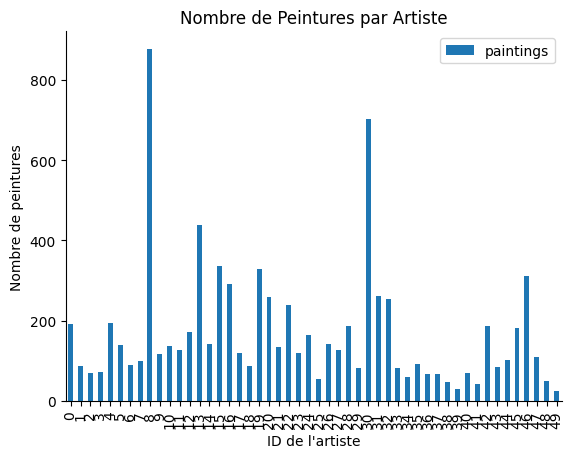

<Figure size 2000x600 with 0 Axes>

In [4]:
# Nombre de peintures par artistes :
artists_df.plot(kind='bar', x='id', y='paintings')
plt.gca().spines[['top', 'right']].set_visible(False)
plt.xlabel('ID de l\'artiste')
plt.ylabel('Nombre de peintures')
plt.title('Nombre de Peintures par Artiste')
plt.figure(figsize=(20, 6))
plt.show()

**Remarque :** La distribution des tableaux est très différente suivant les artistes : certains ont en une vingtaine et d'autres ont plus de 400 tableaux. Cela peut créer un **déséquilibre** qui peut affecter l'apprentissage du modèle.

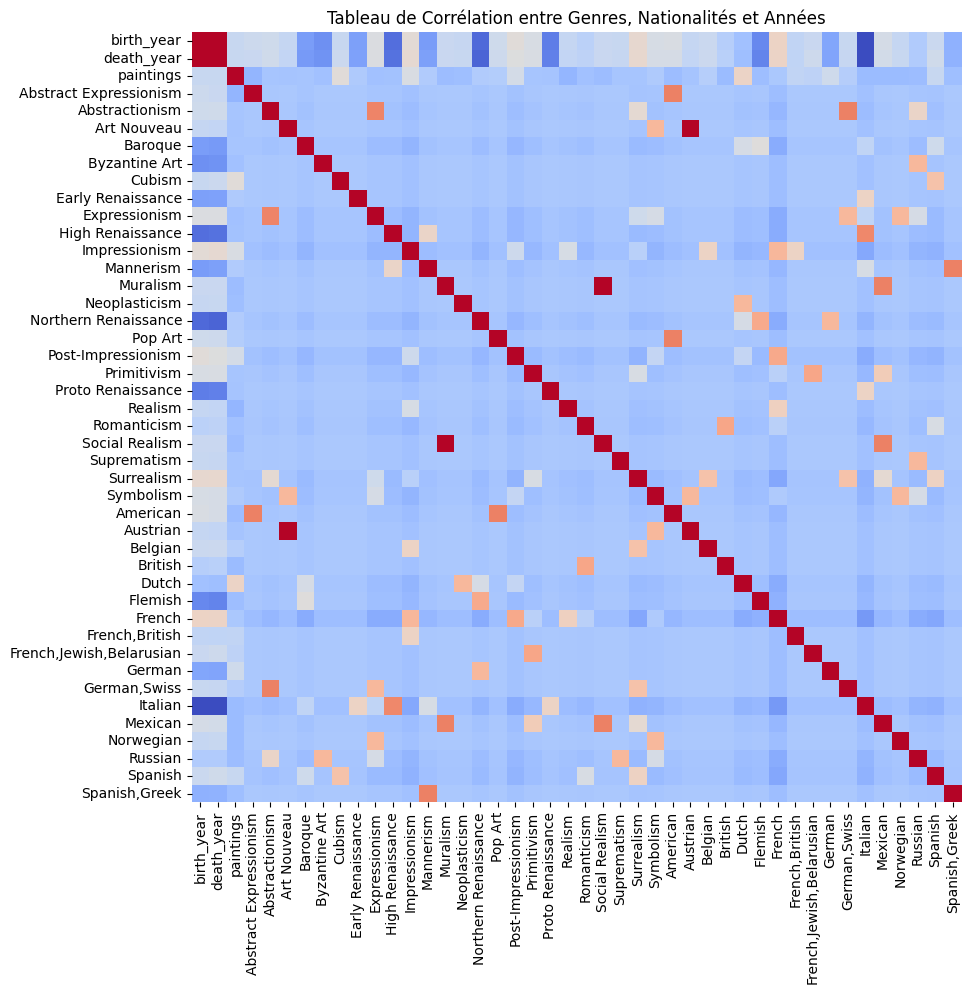

In [5]:
## Etude des corrélations :
artists_df['years'] = artists_df['years'].str.replace('–', '-')

artists_df['birth_year'] = artists_df['years'].str.split(' - ').str[0].astype(int)
artists_df['death_year'] = artists_df['years'].str.split(' - ').str[1].astype(int)

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


# Ccolonnes d'indicateurs pour les genres
genre_dummies = artists_df['genre'].str.get_dummies(sep=',').rename(columns=lambda x: x.strip())

# Encoder les nationalités
nationality_dummies = pd.get_dummies(artists_df['nationality'])

artists_df['birth_year'] = artists_df['years'].str.split(' - ').str[0].str.strip().str.extract('(\d+)').astype(int)
artists_df['death_year'] = artists_df['years'].str.split(' - ').str[1].str.strip().str.extract('(\d+)').astype(int)

# Combiner
encoded_df = pd.concat([artists_df[['birth_year', 'death_year', 'paintings']], genre_dummies, nationality_dummies], axis=1)

# Étape 2 : Calculer le tableau de corrélation
correlation_matrix = encoded_df.corr()

# Visualisation
plt.figure(figsize=(14, 10))
sns.heatmap(correlation_matrix, annot=False, fmt=".2f", cmap='coolwarm', square=True, cbar=False)
plt.title('Tableau de Corrélation entre Genres, Nationalités et Années')
plt.show()


Nous remarquons de nombreuses corrélations entre les variables, comme par exemple des corrélations  :

Très forte entre :

- **Autrichien** avec **Art Nouveau** : expliqué par La "Sécession viennoise" un courant de l'Art nouveau qui a eu court en Autriche, surtout à Vienne, de 1892 à 1906.

- **Social Realisme** et **Muralism** : qui partagent un engagement envers la représentation des luttes sociales et politiques nottament ainsi que des périodes proches.

forte entre :

- **German, swiss** et **Art Nouveau** : proximité des courants Allemands et Suisses au courant Autrichien.

- **American** avec **Pop Art** et **abstract expressionism** : la pop Art étant très développé aux US depuis son apparition en Angleterre? L'abstract expression est lui apparu aux US.

- **Italian** et **Art Renaissance** : courant richement italien.

fortement inversement corrélé entre :   

- **Italien** et **date of birth** : les peintres italiens sont très vieux, leurs peintures aussi.

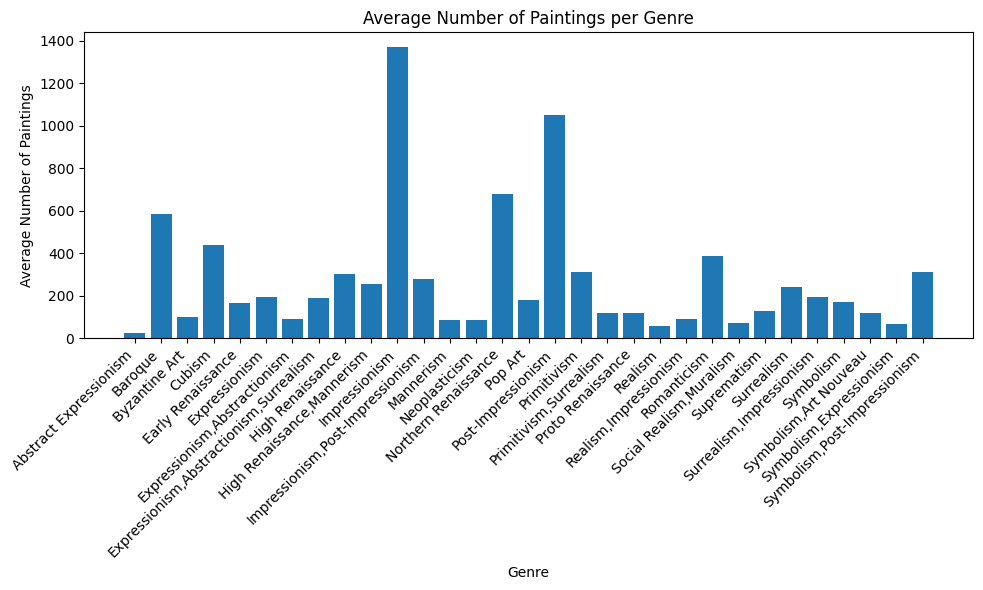

In [6]:
genre_paintings = artists_df.groupby('genre')['paintings'].sum()

plt.figure(figsize=(10, 6))  
plt.bar(genre_paintings.index, genre_paintings.values)
plt.xlabel('Genre')
plt.ylabel('Average Number of Paintings')
plt.title('Average Number of Paintings per Genre')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

**Remarque:** Les genres artistiques sont variés, et certains artistes peuvent être associés à plusieurs styles. Cela nécessite une approche flexible pour le modèle, car un artiste peut peindre dans divers genres au cours de sa vie.

# 1. Préparation des données :

### **1.1. Chargement et choix de la qualité des images**


- Nous allons commencer par travailler sur les images nettes **(images_hq)** car les détails sont importants : ils permettent de capturer des détails fins dans les peintures, comme les textures de la peinture, les coups de pinceau et les variations de couleur, qui sont cruciaux pour l'identification d'un style ou d'un artiste. Bien que toutes les images soient redimensionnées en 224x224 dans notre modèle, la richesse des détails d'origine reste un atout, car les informations subtiles présentes dans les images haute résolution sont souvent mieux conservées même après le redimensionnement. Cela permet au modèle d'apprendre à reconnaître des caractéristiques spécifiques qui peuvent ne pas être visibles dans des images de moindre qualité.

- Les images basse qualité **(images_lq)** pouront éventuellement être utilisées pour tester le modèle ou pour des étapes intermédiaires. Utiliser des images de basse qualité pour tester le modèle permet d'évaluer comment il performe dans des scénarios moins idéaux. Cela peut aider à identifier des faiblesses dans le modèle qui pourraient ne pas être apparentes avec des images haute définition.



Toutefois, nous n'excluons pas l'utilisation des images de basse qualité si les images de haute qualité prenne trop de temps à l'entraînement.



Étant donné que les images de faible qualité **(low quality)** n'étaient initialement pas organisées dans des dossiers correspondant à chaque artiste, on a créé un dépôt Git où ces données ont été réorganisées et classées par dossiers selon les artistes. Ce dépôt est accessible via https://github.com/maidinhnam/hddl_1.git.

In [7]:
import os
import shutil
!git clone https://github.com/maidinhnam/hddl_1.git

Cloning into 'hddl_1'...
remote: Enumerating objects: 16911, done.
remote: Total 16911 (delta 0), reused 0 (delta 0), pack-reused 16911 (from 1)
Receiving objects: 100% (16911/16911), 2.16 GiB | 45.69 MiB/s, done.
Resolving deltas: 100% (1/1), done.
Updating files: 100% (16803/16803), done.


Ici, nous préparons les données **d'images de haute qualité (HQ)** à partir du répertoire **images_hq** pour entraîner le modèle. Plus précisément, nous extrayons les chemins d'accès de chaque image, attribuons un label numérique à chaque artiste, et effectuons une correspondance entre le nom de l'artiste et son label.

In [8]:
# Chemin
images_hq_path = "./hddl_1/images_hq"
img_size = (224, 224)  # Resize images to 224x224

# Lists to store image paths and labels
image_hq_paths = []
labels_hq = []
artist_hq_label_mapping = {}  # Dictionary to map artist names to numerical labels

#Boucle sur les artistes
artist_index = 0
for artist_dir in os.listdir(images_hq_path):
    artist_path = os.path.join(images_hq_path, artist_dir)
    if os.path.isdir(artist_path):
        artist_hq_label_mapping[artist_dir] = artist_index
        for filename in os.listdir(artist_path):
            if filename.endswith(".jpg"):
                image_path = os.path.join(artist_path, filename)
                image_hq_paths.append(image_path)
                labels_hq.append(artist_index)
        artist_index += 1

print(f"Number of images found: {len(image_hq_paths)}")
print(f"Number of artists: {len(artist_hq_label_mapping)}")

Number of images found: 8446
Number of artists: 50


Nous effectuons la même préparation avec les **images de basse qualité (LQ)**.

In [9]:
images_lq_path = "./hddl_1/images_lq"

# Liste pour memoriser chemins et labels des artistes
image_lq_paths = []  # Liste pour memoriser chemins des images LQ
labels_lq = []
artist_lq_label_mapping = {}  # Dictionnaire des artistes 

# Boucle sur les artistes
artist_index = 0
for artist_dir in os.listdir(images_lq_path):
    artist_path = os.path.join(images_lq_path, artist_dir)
    if os.path.isdir(artist_path):
        artist_lq_label_mapping[artist_dir] = artist_index  
        for filename in os.listdir(artist_path):
            if filename.endswith(".jpg"):
                image_path = os.path.join(artist_path, filename)
                image_lq_paths.append(image_path)  # on ajoute une image aux chemins predefini
                labels_lq.append(artist_index)  
        artist_index += 1  # Incrementation

print(f"Number of images found: {len(image_lq_paths)}")  # Print 
print(f"Number of artists: {len(artist_lq_label_mapping)}")  # Print

Number of images found: 8355
Number of artists: 50


Ici, nous analysons les **tailles des images** dans les deux **répertoires contenant des images de haute qualité (HQ) et de faible qualité (LQ)**. Nous extrayons les **dimensions** de toutes les images et identifions **l'image ayant la plus petite surface** (basée sur la hauteur et la largeur). Ensuite, nous créons un **graphique en boîte (boxplot)** pour comparer la **distribution des tailles d'images** entre les groupes HQ et LQ, ce qui permet de visualiser clairement les différences de taille entre ces deux ensembles d'images. Enfin, nous affichons les informations concernant l'image la plus petite dans les deux répertoires pour savoir exactement quelle est **la plus petite image** dans chacun.

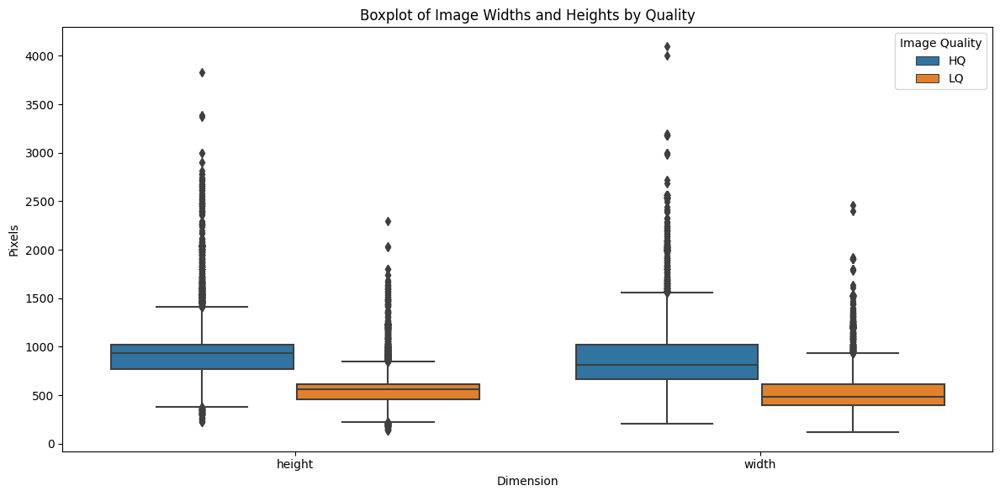

Smallest HQ Image: Pablo_Picasso_140.jpg with dimensions 261x213
Smallest LQ Image: Pablo_Picasso_140.jpg with dimensions 157x128


In [11]:
def get_image_sizes(image_dir):
    img_sizes = []
    smallest_dim = float('inf')
    smallest_image = None

    for artist_dir in os.listdir(image_dir):
        artist_path = os.path.join(image_dir, artist_dir)
        if os.path.isdir(artist_path):
            for filename in os.listdir(artist_path):
                if filename.endswith(".jpg"):
                    img = img_to_array(load_img(os.path.join(artist_path, filename)))
                    h, w = img.shape[:2]
                    img_sizes.append((h, w))

                    if h * w < smallest_dim:
                        smallest_dim = h * w
                        smallest_image = (filename, h, w)

    return np.array(img_sizes), smallest_image

hq_img_size, hq_smallest = get_image_sizes(images_hq_path)
lq_img_size, lq_smallest = get_image_sizes(images_lq_path)


hq_df = pd.DataFrame(hq_img_size, columns=['height', 'width'])
hq_df['quality'] = 'HQ'

lq_df = pd.DataFrame(lq_img_size, columns=['height', 'width'])
lq_df['quality'] = 'LQ'

combined_df = pd.concat([hq_df, lq_df], ignore_index=True)

plt.figure(figsize=(12, 6))
sns.boxplot(data=combined_df.melt(id_vars='quality', value_vars=['height', 'width']),
             x='variable', y='value', hue='quality')
plt.title("Boxplot of Image Widths and Heights by Quality")
plt.xlabel('Dimension')
plt.ylabel('Pixels')
plt.legend(title='Image Quality')
plt.tight_layout()
plt.show()

print(f"Smallest HQ Image: {hq_smallest[0]} with dimensions {hq_smallest[1]}x{hq_smallest[2]}")
print(f"Smallest LQ Image: {lq_smallest[0]} with dimensions {lq_smallest[1]}x{lq_smallest[2]}")


Le diagramme en boîte montre que les images de haute qualité **(HQ)** sont généralement **plus grandes** et ont une résolution **plus élevée** que les images de faible qualité **(LQ)**. La taille des images HQ se concentre généralement autour de 500x500, et la plus petite image HQ mesure 261x213. Ainsi, il est tout à fait possible de **redimensionner ces images à une taille de 224x224** pour les utiliser dans un modèle avec une entrée de 224x224 sans que cela n'affecte significativement les données.

### **1.2. Division des données en entraînement, validation et test**

Ici, nous créons un **DataFrame** à partir de la liste des images **HQ** et de leurs **étiquettes**. Ensuite, les données sont divisées en trois parties : **70%** pour l'ensemble d'entraînement **(training set)**, **15%** pour l'ensemble de validation **(validation set)**, et **15%** pour l'ensemble de test **(test set)**.

In [13]:
# Create DataFrame for images and labels
df_hq = pd.DataFrame({
    'filename': image_hq_paths,
    'class': [list(artist_hq_label_mapping.keys())[list(artist_hq_label_mapping.values()).index(label_hq)] for label_hq in labels_hq]
})
# Split la data en entrainement (70%)
train_df_hq, remaining_df_hq = train_test_split(df_hq, test_size=0.3, random_state=42, stratify=df_hq['class'])

# Split la data restante en validation (15%) et test (15%)
valid_df_hq, test_df_hq = train_test_split(remaining_df_hq, test_size=0.5, random_state=42, stratify=remaining_df_hq['class'])

print(f"Training set size: {len(train_df_hq)}")
print(f"Validation set size: {len(valid_df_hq)}")
print(f"Test set size: {len(test_df_hq)}")


Training set size: 5912
Validation set size: 1267
Test set size: 1267


**Est-ce que le data-set est bien balancé ?**

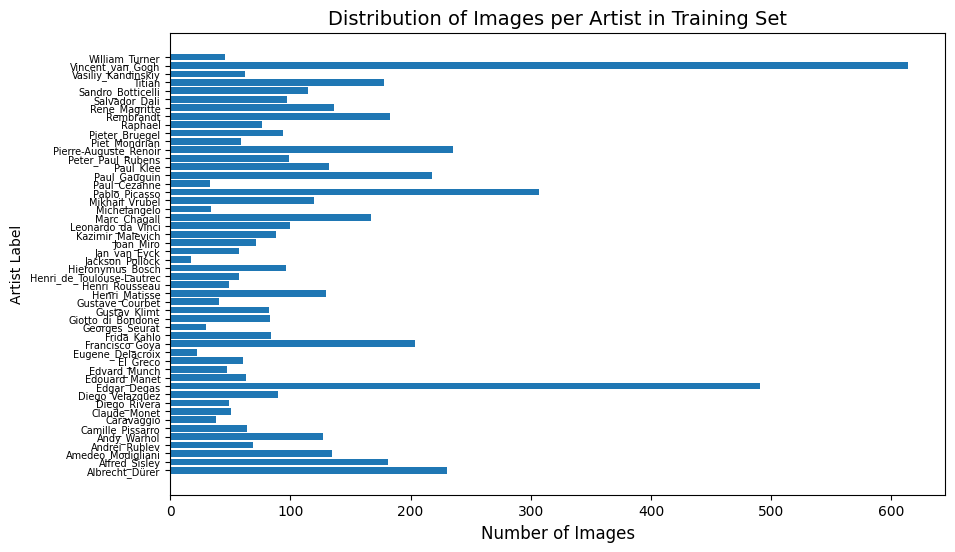

Standard Deviation of Images per Artist: 110.18640236120844
The dataset appears to be imbalanced.


In [14]:
#nombre d'images per artiste :
artist_counts = train_df_hq.groupby('class').size()

# Plot
plt.figure(figsize=(10, 6))
plt.barh(artist_counts.index, artist_counts.values)  
plt.xlabel('Number of Images', fontsize=12) 
plt.ylabel('Artist Label', fontsize=10)  
plt.title('Distribution of Images per Artist in Training Set', fontsize=14)  
plt.xticks(fontsize=10)  
plt.yticks(fontsize=7)  
plt.show()

# deviation 
std_dev = artist_counts.std()


print(f"Standard Deviation of Images per Artist: {std_dev}")

# Checking if si le dataset est balancé basé sur la deviation 
if std_dev < 10: 
    print("The dataset appears to be relatively balanced.")
else:
    print("The dataset appears to be imbalanced.")




Comme le jeu de données est déséquilibré, plusieurs techniques peuvent être envisagées pour améliorer la performance du modèle.

Parmi elles, on peut citer la **data augmentation** et l'**oversampling** que nous avons vus en TP.

* La data augmentation consiste à générer de nouvelles données à partir des données existantes permettant d'augmenter la taille des classes minoritaires. 

* L'oversampling consiste à dupliquer les exemples de la classe minoritaire afin d'équilibrer la distribution des classes. 

**Ces techniques peuvent contribuer à améliorer la précision du modèle en réduisant le biais induit par le déséquilibre du jeu de données.**


### **1.3. Redimmensionnement des images :**

Dans cette section, nous avons créé des **ImageDataGenerator** pour trois ensembles de données : entraînement (training), validation et test. Chaque ImageDataGenerator effectue une étape de normalisation des images (rescaling), en divisant les valeurs des pixels des images de la plage [0, 255] à [0, 1] pour améliorer la performance et la rapidité de l'apprentissage du modèle.

Ensuite, nous avons créé des **générateurs** pour les trois ensembles de données en utilisant la méthode flow_from_dataframe. Cette méthode permet de charger les images à partir d'un DataFrame contenant les chemins des images et leurs étiquettes correspondantes, et elle traite automatiquement les images avec les paramètres suivants :

- **target_size** : La taille à laquelle les images seront redimensionnées, ici 224x224.
- **batch_size** : La taille du lot est définie à 65. Bien que 5291 (le nombre d'exemples dans l'ensemble d'entraînement) ne soit pas divisible par 65, le dernier lot contiendra 62 exemples, ce qui est tout à fait acceptable. Cela permet de maintenir la stabilité de l'apprentissage, car la différence entre les tailles de lots est faible.
- **class_mode** : Défini sur 'categorical', ce qui signifie que les étiquettes seront converties en vecteurs one-hot, permettant une classification multi-classe.
- **shuffle** : Activé (True) pour mélanger les données à chaque époque, afin d'éviter que le modèle ne devienne dépendant de l'ordre des exemples dans les données.

In [16]:
# Créer ImageDataGenerator
train_datagen = ImageDataGenerator(
    rescale=1./255
)

valid_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

# Créer generators
train_generator = train_datagen.flow_from_dataframe(
    train_df_hq,
    x_col='filename',
    y_col='class',
    target_size=img_size,
    batch_size=65,
    class_mode='categorical',
    shuffle=True,
)

valid_generator = valid_datagen.flow_from_dataframe(
    valid_df_hq,
    x_col='filename',
    y_col='class',
    target_size=img_size,
    batch_size=65,
    class_mode='categorical'
)

test_generator = test_datagen.flow_from_dataframe(
    test_df_hq,
    x_col='filename',
    y_col='class',
    target_size=img_size,
    batch_size=65,
    class_mode='categorical'
)

Found 5912 validated image filenames belonging to 50 classes.
Found 1267 validated image filenames belonging to 50 classes.
Found 1267 validated image filenames belonging to 50 classes.


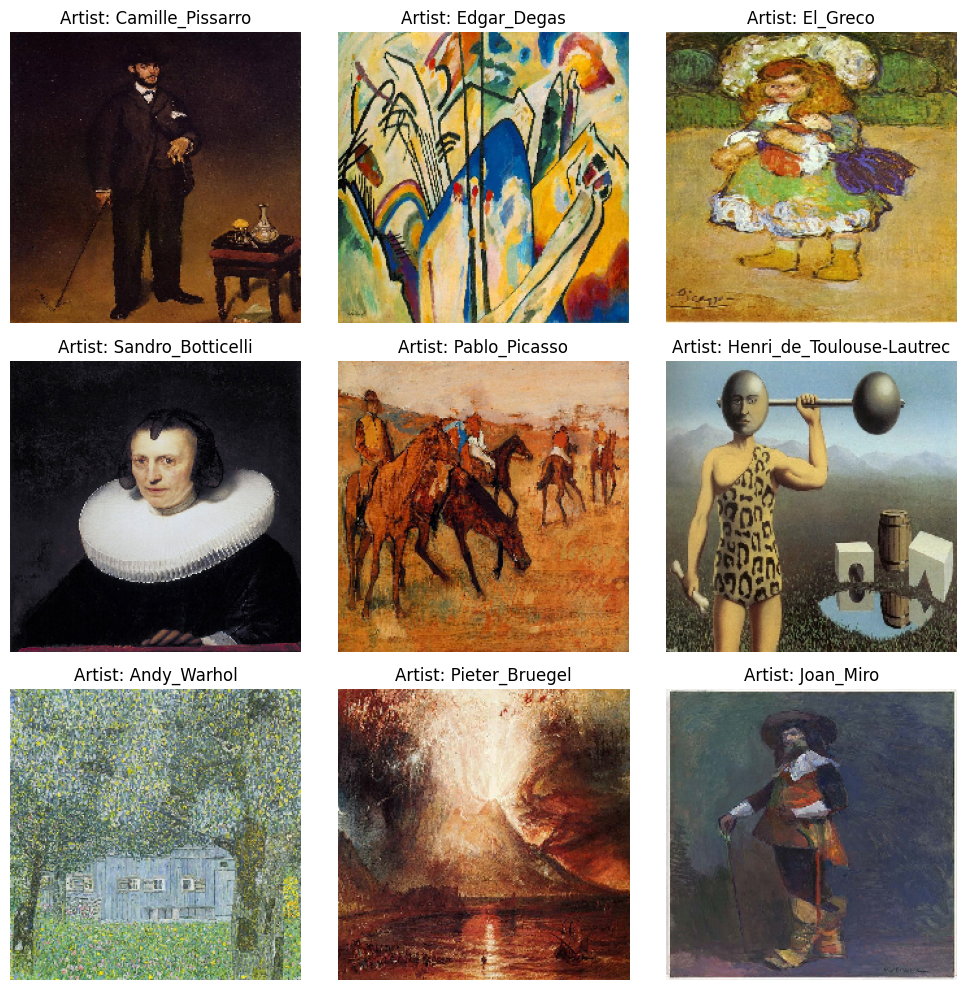

In [17]:
#mapping des classes, indices en noms d'artistes
label_to_artist = {v: k for k, v in artist_hq_label_mapping.items()}

# Batch pour le generator
images, labels = next(train_generator)

#Affichage des images 
plt.figure(figsize=(10, 10))
for i in range(9):  
    plt.subplot(3, 3, i + 1) #Plot
    plt.imshow(images[i])
    label_index = np.argmax(labels[i])  # Label de l'artiste
    artist_name = label_to_artist[label_index]  # Nom de l'artiste

    plt.title(f"Artist: {artist_name}")  # Affiche nom artiste
    plt.axis('off')

plt.tight_layout()
plt.show()

**Avoir la même taille d'images est crucial pour l'entraînement des modèles de deep learning notamment les réseaux neuronaux convolutifs.**

# 2. Entrainement des données :

### **2.1. Première approche : Réseau convolutionnel basique**




Nous allons ici construire un classificateur avec une architecture personnalisée d'un réseau de neurones convolutionnel.

**Architecture du modèle**

Toutes les images ont été redimensionnées à 224x224, ce qui permet de définir un réseau de neurones convolutionnel selon le schéma suivant :

1. Dans la première phase, le réseau alterne entre des couches de convolution et de Max Pooling pour réduire progressivement la taille des représentations tout en extrayant des caractéristiques importantes des images.

Le modèle que nous définissons est composé de 4 blocs convolutionnels ayant la forme suivante :

- **Une couche Conv2D** avec des filtres de taille 3×3 et une fonction d'activation ReLU. La première couche aura 32 filtres de convolution, la deuxième 64, la troisième 128, et la quatrième également 128.
- **Une couche MaxPooling2D** avec une fenêtre 2×2, qui réduit la dimension spatiale des tenseurs de manière progressive.
Après les blocs convolutionnels, nous ajoutons :

- **Une couche Flatten** pour aplatir les données multidimensionnelles et les préparer à l'entrée dans les couches entièrement connectées (Dense).
- **Une couche Dense** avec 512 neurones et une fonction d'activation ReLU pour introduire plus de non-linéarité et apprendre des représentations complexes.
- **Une couche BatchNormalization** pour normaliser les activations et accélérer l'entraînement :


$$y_i = \gamma \cdot \frac{x_i - \mu_B}{\sqrt{\sigma_B^2 + \epsilon}} + \beta$$

* $y_i$ est la sortie et $x_i$ est l'entrée.

* $( \mu_B )$ et $( \sigma_B^2 )$ : garantissent que les activations dans le batch ont une moyenne nulle et une variance unitaire.


* $( \gamma )$ et $(\beta )$ : transformation affine pour restaurer une distribution optimale.

- **Une couche Dense** avec 128 neurones et une fonction d'activation ReLU.
- **Une dernière couche Dense** avec 50 neurones, correspondant aux 50 artistes, et une fonction d'activation Softmax pour la classification.

Le modèle est compilé avec l'optimiseur **Adam** et une fonction de perte **categorical_crossentropy**, adaptée à un problème de classification multiclasse.

$$\mathcal{L}_{\text{categorical\_crossentropy}} = - \frac{1}{N} \sum_{i=1}^N \sum_{k=1}^C y_{i,k} \log(\hat{y}_{i,k})$$

L'indicateur binaire $y_{i,k}$ indique si l'exemple $i$ appartient à la classe $k$ :  

$$
y_{i,k} = 1 \quad \text{si l'exemple $i$ appartient à la classe $k$, sinon} \quad y_{i,k} = 0
$$

La probabilité prédite pour l'exemple $i$ d'appartenir à la classe $k$, obtenue par la fonction softmax, est donnée par :  

$$\hat{y}_{i,k} = \frac{\exp(z_{i,k})}{\sum_{j=1}^C \exp(z_{i,j})}$$ 

où : $z_{i,k}$ est la sortie du modèle (logits) pour l'exemple $i$ et la classe $k$, la taille du batch est  :  $N = \text{taille du batch}$ , le nombre total de classes possibles est donné par :   $C = \text{nombre de classes dans le problème de classification} = 50$   



In [18]:
basic_hq = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(img_size[0], img_size[0], 3)),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(512, activation='relu'),
    BatchNormalization(),
#    Dropout(0.5),
    Dense(128, activation='relu'),
    BatchNormalization(),
    Dense(50, activation='softmax')  # Output layer with 50 neurons for 50 artists
])

# Compile the model
basic_hq.compile(optimizer=Adam(learning_rate=0.001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Print model summary
basic_hq.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 52, 52, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 24, 24, 128)         │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 12, 12, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 18432)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 512)                 │       9,437,696 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 512)                 │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 128)                 │          65,664 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 128)                 │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 50)                  │           6,450 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,753,202 (37.21 MB)

 Trainable params: 9,751,922 (37.20 MB)

 Non-trainable params: 1,280 (5.00 KB)


Ici, nous effectuons deux actions principales :

**plot_training_analysis** : Cette fonction est utilisée pour tracer des graphiques analytiques du processus d'entraînement, montrant l'évolution de la précision et de la perte à la fois pour l'entraînement et la validation à travers les époques. 

**update_history** : Cette fonction sert à mettre à jour les résultats d'entraînement de chaque exécution du modèle dans une variable globale **(total_history)**. 

In [19]:
def plot_training_analysis(total_history):
    acc = total_history['accuracy']
    val_acc = total_history['val_accuracy']
    loss = total_history['loss']
    val_loss = total_history['val_loss']

    epochs = range(len(acc))

    plt.subplot(1, 2, 1)
    plt.plot(epochs, acc, 'b', linestyle="--", label='Training accuracy')
    plt.plot(epochs, val_acc, 'g', label='Validation accuracy')
    plt.title('Training and validation accuracy')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(epochs, loss, 'b', linestyle="--", label='Training loss')
    plt.plot(epochs, val_loss, 'g', label='Validation loss')
    plt.title('Training and validation loss')
    plt.legend()

    plt.tight_layout()
    plt.show()

def update_history(history, total_history):
    for key in history.history:
        if key in total_history:
            total_history[key] += history.history[key]
        else:
            total_history[key] = history.history[key]

Nous entrainons ce modèle et utilisons **ReduceLROnPlateau** comme un callback pendant l'entraînement pour ajuster automatiquement le taux d'apprentissage lorsque la perte de validation (val_loss) cesse de s'améliorer après un certain nombre d'époques.

**monitor='val_loss'** : Nous surveillons l'amélioration de la perte sur le jeu de validation pendant l'entraînement. Si la perte ne s'améliore pas, le taux d'apprentissage sera réduit.

**factor=0.2** : Si aucune amélioration n'est observée dans la perte de validation, le taux d'apprentissage sera réduit à 20% de sa valeur actuelle. Cela aide le modèle à ajuster plus finement les poids quand il se retrouve coincé dans un minimum local.

**patience=2** : Ce paramètre est réglé à 2, ce qui signifie que si la perte de validation ne change pas après 2 époques consécutives, le taux d'apprentissage sera réduit.

**min_lr=1e-6** : C'est la valeur minimale que le taux d'apprentissage peut atteindre.

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


89/89 ━━━━━━━━━━━━━━━━━━━━ 67s 616ms/step - accuracy: 0.1304 - loss: 3.7578 - val_accuracy: 0.0450 - val_loss: 5.6218 - learning_rate: 0.0010
Epoch 2/10
89/89 ━━━━━━━━━━━━━━━━━━━━ 49s 512ms/step - accuracy: 0.2914 - loss: 2.8161 - val_accuracy: 0.0994 - val_loss: 4.9188 - learning_rate: 0.0010
Epoch 3/10
89/89 ━━━━━━━━━━━━━━━━━━━━ 49s 515ms/step - accuracy: 0.3638 - loss: 2.4309 - val_accuracy: 0.1800 - val_loss: 4.0032 - learning_rate: 0.0010
Epoch 4/10
89/89 ━━━━━━━━━━━━━━━━━━━━ 48s 502ms/step - accuracy: 0.4340 - loss: 2.0890 - val_accuracy: 0.2092 - val_loss: 3.7843 - learning_rate: 0.0010
Epoch 5/10
89/89 ━━━━━━━━━━━━━━━━━━━━ 49s 512ms/step - accuracy: 0.5419 - loss: 1.7170 - val_accuracy: 0.2257 - val_loss: 3.1912 - learning_rate: 0.0010
Epoch 6/10
89/89 ━━━━━━━━━━━━━━━━━━━━ 48s 501ms/step - accuracy: 0.7106 - loss: 1.1661 - val_accuracy: 0.2044 - val_loss: 3.9880 - learning_rate: 0.0010
Epoch 7/10
89/89 ━━━━━━━━━━━━━━━━━━━━ 48s 500ms/step - accuracy: 0.8071 - loss: 0.8156 - val_

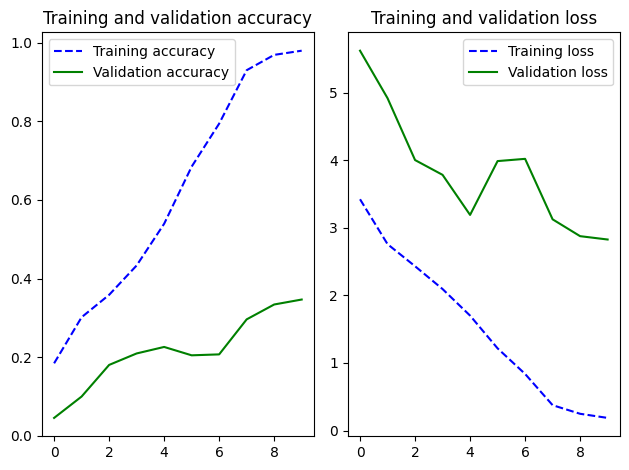

In [20]:
total_history_basic_hq = {}
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, min_lr=1e-6)

# Entrainement
history_basic_hq = basic_hq.fit(
    train_generator,
    epochs=10, 
    validation_data=valid_generator,
    callbacks=[reduce_lr]
)

# evaluation et test
test_loss, test_accuracy = basic_hq.evaluate(test_generator)
print(f"Test accuracy: {test_accuracy}")


print(history_basic_hq.history)
update_history(history_basic_hq, total_history_basic_hq)
plot_training_analysis(total_history_basic_hq)

**Commentaire**: le taux de précision est assez faible : 36 % dans l'ensemble de test. Et nous remarquons que l'accuracy de l'entraînement est très élevée mais que l'accuracy de la validation est très insuffisante. Pareillement la perte en entraînement est basse mais la perte en validation est très élevée Cet écart important témoigne d'un risque de surapprentissage important. Nous devons continuer de travailler pour réduire cet écart au maximum.

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


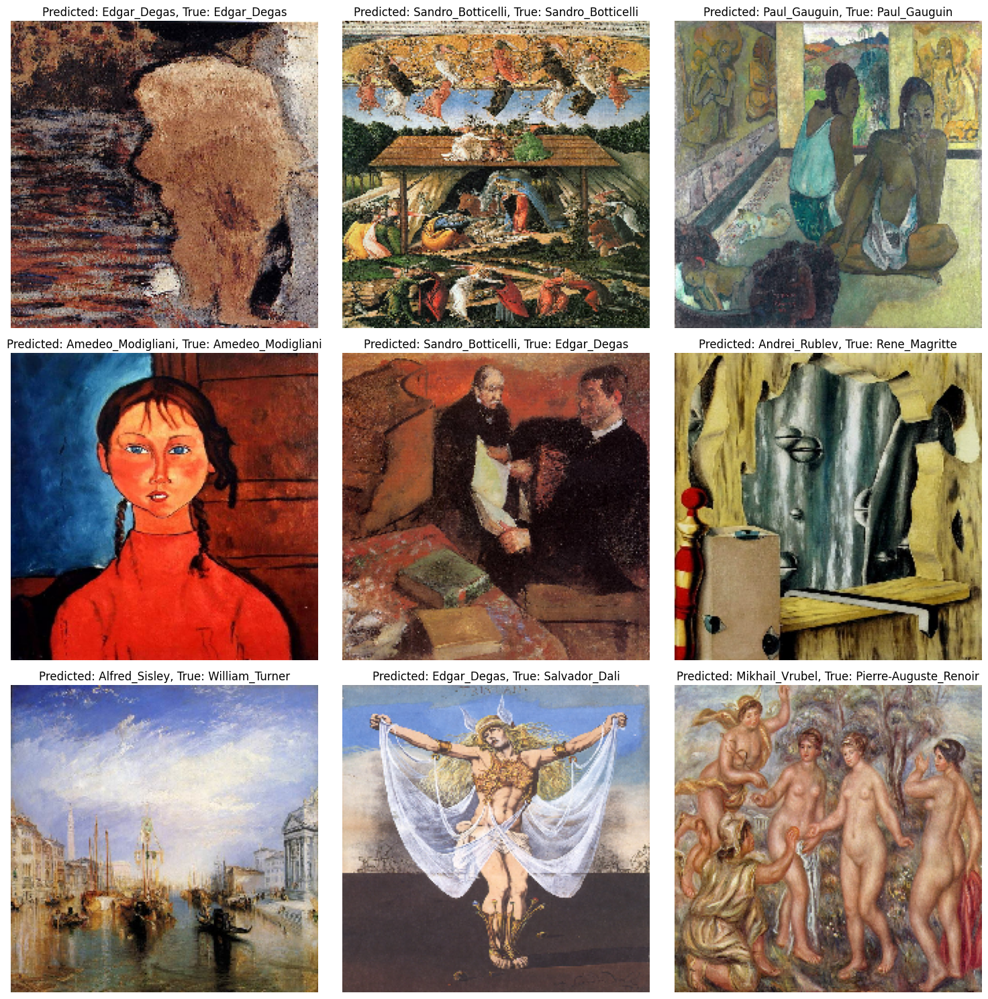

In [34]:
# batch d'images et labels depuis le generator test
images, labels = next(test_generator)

# predictions par batch d'images
predictions = basic_hq.predict(images)

# Get the list of class names (artistes) du generator
class_names = list(test_generator.class_indices.keys())

# Selectionne 9 images à afficher
plt.figure(figsize=(15, 15))
for i in range(9):  
    plt.subplot(3, 3, i + 1)
    plt.imshow(images[i])

    # label (index)
    predicted_label = np.argmax(predictions[i])

    # Converti le label d'un one-hot encoding to index
    true_label = np.argmax(labels[i])

    # affichage
    plt.title(f"Predicted: {class_names[predicted_label]}, True: {class_names[true_label]}")
    plt.axis('off')

plt.tight_layout()
plt.show()



Ici, nous calculons la **matrice de confusion** pour évaluer la précision du modèle sur l'ensemble de test. Après avoir effectué les ***prédictions** et les avoir comparées aux étiquettes réelles, la **matrice de confusion** montre le nombre de prédictions correctes et incorrectes pour chaque auteur. Nous calculons également la **précision** pour chaque auteur et affichons une **carte thermique** pour visualiser les résultats. Enfin, nous imprimons la **précision globale** du modèle ainsi que la précision pour chaque auteur, accompagnée du nombre d'images testées.

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


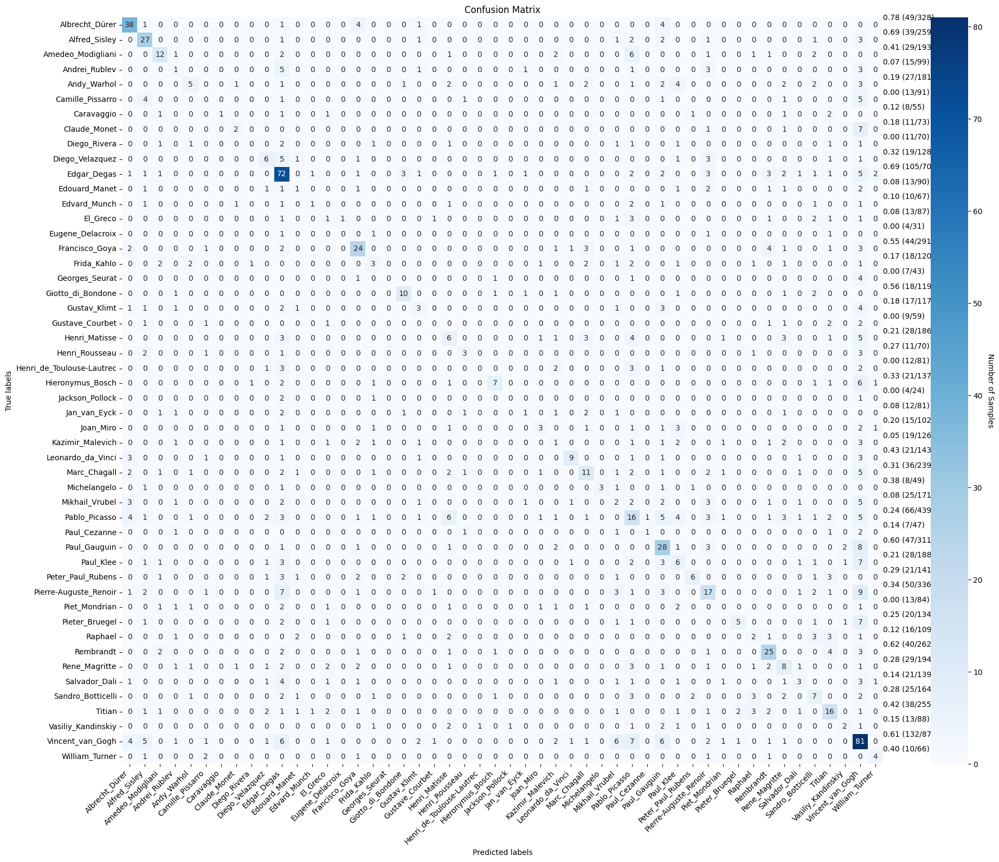

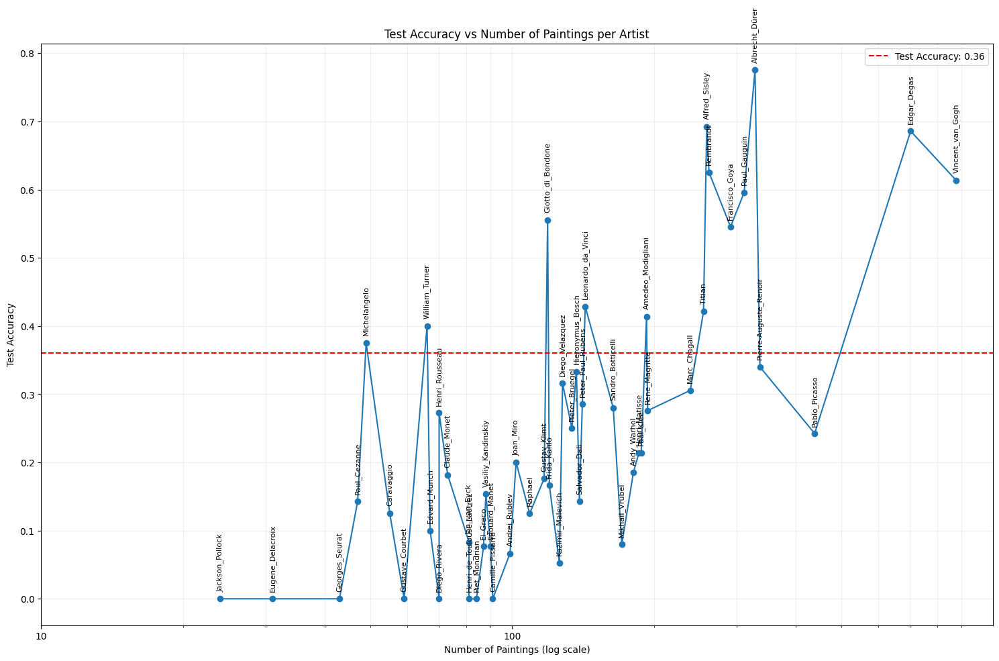

In [59]:
# predictions pour images du test dataset
all_predictions = []
all_true_labels = []
all_images = []

# Boucle par batch sur le test generator
for i in range(len(test_generator)):
    images, labels = next(test_generator)
    predictions = basic_hq.predict(images)
    all_predictions.extend(predictions)
    all_true_labels.extend(labels)
    all_images.extend(images)


all_predictions = np.array(all_predictions)
all_true_labels = np.array(all_true_labels)
all_images = np.array(all_images)


predicted_classes = np.argmax(all_predictions, axis=1)
true_classes = np.argmax(all_true_labels, axis=1)


author_names = list(test_generator.class_indices.keys())

# Calculeconfusion matrix
cm = confusion_matrix(true_classes, predicted_classes)

# Calcule l'accuracy par artiste
author_accuracy = cm.diagonal() / cm.sum(axis=1)

# Get the number of images tested 
test_image_counts = cm.sum(axis=1)

#nombre total of images 
total_image_counts = df_hq['class'].value_counts().sort_index().values

# heatmap for confusion matrix
plt.figure(figsize=(20, 16))
ax = sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=author_names, yticklabels=author_names)

# Add colorbar
cbar = ax.collections[0].colorbar
cbar.set_label('Number of Samples', rotation=270, labelpad=15)

plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')

# Rotate x-axis labels to avoid overlap
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)

# Display accuracy, number of tested images, and total number of images for each author
for i, (accuracy, test_count, total_count) in enumerate(zip(author_accuracy, test_image_counts, total_image_counts)):
    plt.text(len(author_names), i, f'{accuracy:.2f} ({test_count}/{total_count})', ha='left', va='center')

plt.tight_layout()
plt.show()

# Create a DataFrame for easier manipulation
df_accuracy = pd.DataFrame({
    'Artist': author_names,
    'Accuracy': author_accuracy,
    'Total Images': total_image_counts
})

# Tri
df_accuracy = df_accuracy.sort_values('Total Images', ascending=True)

fig, ax1 = plt.subplots(figsize=(15, 10))

# Plot
ax1.plot(df_accuracy['Total Images'], df_accuracy['Accuracy'], marker='o')

ax1.set_xlabel('Number of Paintings (log scale)')
ax1.set_ylabel('Test Accuracy')
ax1.set_title('Test Accuracy vs Number of Paintings per Artist')

ax1.set_xscale('log')

min_images = df_accuracy['Total Images'].min()
max_images = df_accuracy['Total Images'].max()
x_ticks = [10**i for i in range(int(np.log10(min_images)), int(np.log10(max_images))+1)]
ax1.set_xticks(x_ticks)
ax1.set_xticklabels(x_ticks)


for i, row in df_accuracy.iterrows():
    ax1.annotate(row['Artist'], (row['Total Images'], row['Accuracy']),
                 textcoords="offset points", xytext=(0,10), ha='center', rotation=90, fontsize=8)


ax1.grid(True, which="both", ls="-", alpha=0.2)
ax1.axhline(y=test_accuracy, color='red', linestyle='--', label=f'Test Accuracy: {test_accuracy:.2f}')
ax1.legend()
plt.tight_layout()
plt.show()

**Commentaire:** 
Comme vous pouvez le constater, les artistes avec moins de peintures ont souvent un taux de précision plus faible. Cela est dû à plusieurs facteurs lorsqu'un modèle est entraîné sur un jeu de données déséquilibré :

- **Plus de données d'entraînement** : Les artistes ayant plus de peintures permettent au modèle de mieux identifier leurs caractéristiques, réduisant ainsi le risque de surapprentissage pour les autres artistes.

- **Répétition des caractéristiques** : Plus de peintures permettent au modèle de mieux reconnaître les spécificités de chaque auteur.

- **Déséquilibre des données** : Le modèle favorise les classes avec plus de données, ce qui peut conduire à un biais et une précision plus élevée pour ces classes.

- **Mauvaise généralisation** : Pour les artistes ayant peu de peintures, le modèle peut ne pas apprendre suffisamment de caractéristiques, entraînant une précision plus faible pour ces auteurs.

# 3.  Data augmentation et oversampling :


Ici, nous appliquons la méthode de **suréchantillonnage** (oversampling) sur l'ensemble de données d'entraînement afin d'équilibrer le nombre de peintures des différents artistes. Plus précisément :

1. **Création d'un ensemble d'entraînement équilibré** : Nous trouvons l'artiste ayant le plus grand nombre de peintures, puis nous dupliquons les peintures des autres artistes pour que le nombre de peintures de chaque artiste soit égal à celui de l'artiste avec le plus de peintures. Cela permet de réduire les biais pendant l'entraînement, où le modèle pourrait favoriser les artistes ayant plus de peintures. Cependant, l'oversampling peut aussi entraîner un **surapprentissage (overfitting)**, car il crée des répétitions dans les données.

2. **Utilisation de l'augmentation de données (data augmentation)** : Pour limiter les effets négatifs du surapprentissage induits par l'oversampling, nous appliquons des techniques d'**augmentation de données** telles que le **shearing**, le **flip horizontal** et le **flip vertical**. Ces transformations permettent d'augmenter la diversité des données d'entraînement sans ajouter de nouvelles images, ce qui aide à réduire le surapprentissage tout en améliorant la capacité du modèle à généraliser.



In [50]:
from collections import Counter
# Find the maximum number of paintings by a single artist in the training set
artist_counts = Counter(train_df_hq['class'])
max_paintings = max(artist_counts.values())
# Function to oversample the training set
def oversample_train_set(df):
    new_data = []
    for artist, group in df.groupby('class'):
        current_count = len(group)
        needed_count = max_paintings - current_count
        
        if needed_count == 0:
            new_data.extend(group.to_dict('records'))
        else:
            repeats = [max_paintings // current_count + (1 if i < max_paintings % current_count else 0) 
                       for i in range(current_count)]
            
            for (_, row), repeat in zip(group.iterrows(), repeats):
                for _ in range(repeat):
                    new_data.append(row.to_dict())
    
    return pd.DataFrame(new_data)

# Apply oversampling to the training set
train_df_oversampled = oversample_train_set(train_df_hq)
print(f"Training set size after oversampling: {len(train_df_oversampled)}")

# Create ImageDataGenerators
train_datagen = ImageDataGenerator(
    rescale=1./255,
    shear_range=5,
    horizontal_flip=True,
    vertical_flip=True,
)

valid_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

# Create generators
train_generator = train_datagen.flow_from_dataframe(
    train_df_oversampled,
    x_col='filename',
    y_col='class',
    target_size=img_size,
    batch_size=65,
    class_mode='categorical'
)

valid_generator = valid_datagen.flow_from_dataframe(
    valid_df_hq,
    x_col='filename',
    y_col='class',
    target_size=img_size,
    batch_size=65,
    class_mode='categorical'
)

test_generator = test_datagen.flow_from_dataframe(
    test_df_hq,
    x_col='filename',
    y_col='class',
    target_size=img_size,
    batch_size=65,
    class_mode='categorical'
)

Training set size after oversampling: 30700
Found 30700 validated image filenames belonging to 50 classes.
Found 1267 validated image filenames belonging to 50 classes.
Found 1267 validated image filenames belonging to 50 classes.


In [51]:
do_hq = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(img_size[0], img_size[0], 3)),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(512, activation='relu'),
    BatchNormalization(),
#    Dropout(0.5),
    Dense(128, activation='relu'),
    BatchNormalization(),
    Dense(50, activation='softmax')  # Output layer with 50 neurons for 50 artists
])

do_hq.compile(optimizer=Adam(learning_rate=0.001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

do_hq.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_4 (Conv2D)                    │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_5 (MaxPooling2D)       │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_6 (Conv2D)                    │ (None, 52, 52, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_6 (MaxPooling2D)       │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_7 (Conv2D)                    │ (None, 24, 24, 128)         │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_7 (MaxPooling2D)       │ (None, 12, 12, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_3 (Flatten)                  │ (None, 18432)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 512)                 │       9,437,696 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 512)                 │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 128)                 │          65,664 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_5                │ (None, 128)                 │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_9 (Dense)                      │ (None, 50)                  │           6,450 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,753,202 (37.21 MB)

 Trainable params: 9,751,922 (37.20 MB)

 Non-trainable params: 1,280 (5.00 KB)

Epoch 1/6
473/473 ━━━━━━━━━━━━━━━━━━━━ 444s 925ms/step - accuracy: 0.2043 - loss: 3.0675 - val_accuracy: 0.1760 - val_loss: 3.3125 - learning_rate: 0.0010
Epoch 2/6
473/473 ━━━━━━━━━━━━━━━━━━━━ 441s 920ms/step - accuracy: 0.4845 - loss: 1.9182 - val_accuracy: 0.2707 - val_loss: 2.8565 - learning_rate: 0.0010
Epoch 3/6
473/473 ━━━━━━━━━━━━━━━━━━━━ 447s 931ms/step - accuracy: 0.7199 - loss: 1.0717 - val_accuracy: 0.2810 - val_loss: 3.1886 - learning_rate: 0.0010
Epoch 4/6
473/473 ━━━━━━━━━━━━━━━━━━━━ 446s 929ms/step - accuracy: 0.8542 - loss: 0.5590 - val_accuracy: 0.3125 - val_loss: 3.2671 - learning_rate: 0.0010
Epoch 5/6
473/473 ━━━━━━━━━━━━━━━━━━━━ 443s 922ms/step - accuracy: 0.9351 - loss: 0.2665 - val_accuracy: 0.4159 - val_loss: 2.5936 - learning_rate: 2.0000e-04
Epoch 6/6
473/473 ━━━━━━━━━━━━━━━━━━━━ 450s 936ms/step - accuracy: 0.9650 - loss: 0.1642 - val_accuracy: 0.4112 - val_loss: 2.6834 - learning_rate: 2.0000e-04
20/20 ━━━━━━━━━━━━━━━━━━━━ 9s 429ms/step - accuracy: 0.4264 - 

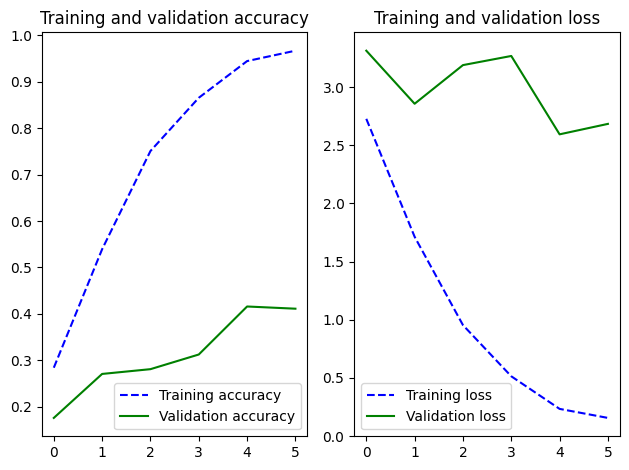

In [53]:
total_history_do_hq = {}
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, min_lr=1e-6)

# Train the model
history_do_hq = do_hq.fit(
    train_generator,
    epochs=6,
    validation_data=valid_generator,
    callbacks=[reduce_lr]
)

test_loss, test_accuracy = do_hq.evaluate(test_generator)
print(f"Test accuracy: {test_accuracy}")

print(history_do_hq.history)
update_history(history_do_hq, total_history_do_hq)
plot_training_analysis(total_history_do_hq)

**Commentaire:**

Les résultats obtenus en utilisant **le suréchantillonnage** (oversampling) et **l'augmentation des données** (data augmentation) sont environ 41% meilleurs que ceux obtenus initialement. Cependant, le phénomène de **surapprentissage** (overfitting) persiste toujours.

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


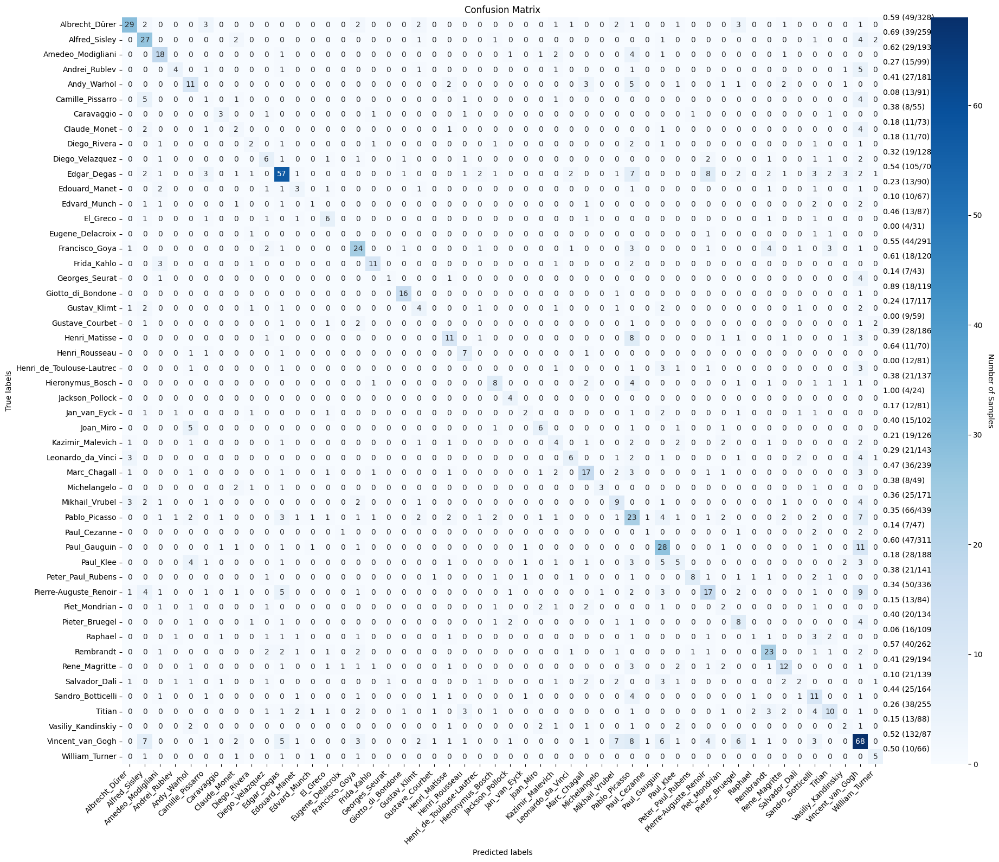

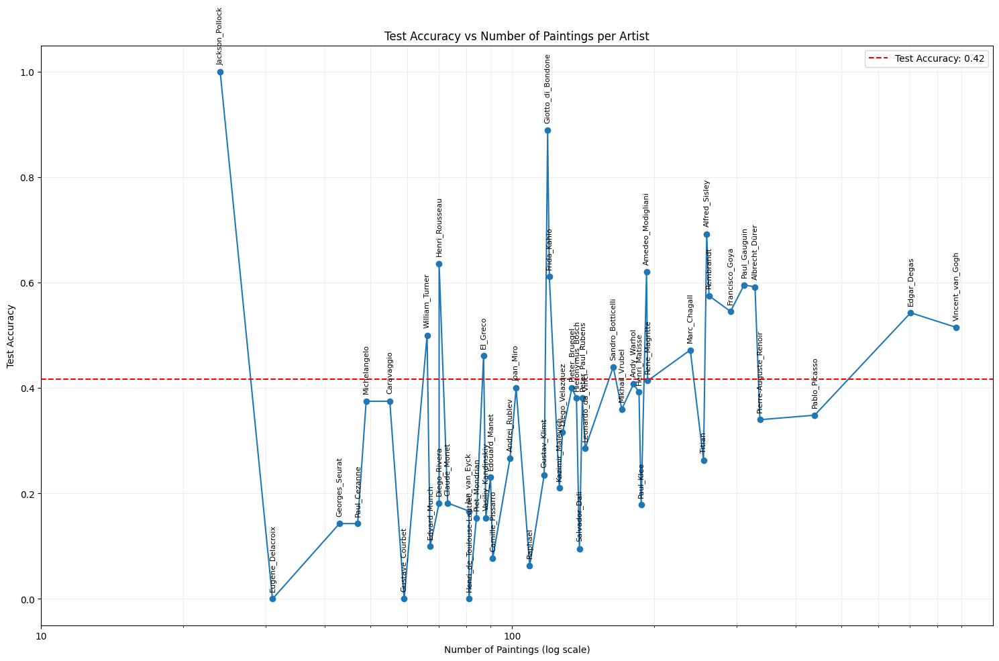

In [58]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Make predictions for all images in the test set
all_predictions = []
all_true_labels = []
all_images = []

# Boucle par batch dans le test generator
for i in range(len(test_generator)):
    images, labels = next(test_generator)
    predictions = do_hq.predict(images)
    all_predictions.extend(predictions)
    all_true_labels.extend(labels)
    all_images.extend(images)

all_predictions = np.array(all_predictions)
all_true_labels = np.array(all_true_labels)
all_images = np.array(all_images)

predicted_classes = np.argmax(all_predictions, axis=1)
true_classes = np.argmax(all_true_labels, axis=1)

author_names = list(test_generator.class_indices.keys())

cm = confusion_matrix(true_classes, predicted_classes)

#l'accuracy par auteur
author_accuracy = cm.diagonal() / cm.sum(axis=1)

test_image_counts = cm.sum(axis=1)

total_image_counts = df_hq['class'].value_counts().sort_index().values

# heatmap
plt.figure(figsize=(20, 16))
ax = sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=author_names, yticklabels=author_names)

cbar = ax.collections[0].colorbar
cbar.set_label('Number of Samples', rotation=270, labelpad=15)

plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')

plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)

# Display accuracy, number of tested images, and total number of images for each author
for i, (accuracy, test_count, total_count) in enumerate(zip(author_accuracy, test_image_counts, total_image_counts)):
    plt.text(len(author_names), i, f'{accuracy:.2f} ({test_count}/{total_count})', ha='left', va='center')

plt.tight_layout()
plt.show()

# Create a DataFrame for easier manipulation
df_accuracy = pd.DataFrame({
    'Artist': author_names,
    'Accuracy': author_accuracy,
    'Total Images': total_image_counts
})

# Sort the DataFrame by total images in ascending order
df_accuracy = df_accuracy.sort_values('Total Images', ascending=True)

# Create a figure with a single subplot
fig, ax1 = plt.subplots(figsize=(15, 10))

# Plot accuracy vs total images as a line plot
ax1.plot(df_accuracy['Total Images'], df_accuracy['Accuracy'], marker='o')

ax1.set_xlabel('Number of Paintings (log scale)')
ax1.set_ylabel('Test Accuracy')
ax1.set_title('Test Accuracy vs Number of Paintings per Artist')

# Set x-axis to log scale
ax1.set_xscale('log')

# Create custom x-ticks
min_images = df_accuracy['Total Images'].min()
max_images = df_accuracy['Total Images'].max()
x_ticks = [10**i for i in range(int(np.log10(min_images)), int(np.log10(max_images))+1)]
ax1.set_xticks(x_ticks)
ax1.set_xticklabels(x_ticks)

for i, row in df_accuracy.iterrows():
    ax1.annotate(row['Artist'], (row['Total Images'], row['Accuracy']),
                 textcoords="offset points", xytext=(0,10), ha='center', rotation=90, fontsize=8)

ax1.grid(True, which="both", ls="-", alpha=0.2)
ax1.axhline(y=test_accuracy, color='red', linestyle='--', label=f'Test Accuracy: {test_accuracy:.2f}')
ax1.legend()
plt.tight_layout()
plt.show()


**Commentaire:**

L'utilisation du **suréchantillonnage** (oversampling) et de **l'augmentation des données** (data augmentation) permet au modèle de devenir moins dépendant des artistes ayant un grand nombre de peintures. La **précision** pour chaque artiste s'est également améliorée, et le modèle est désormais moins influencé par le nombre de peintures de chaque artiste.

# 4.  Pre-trained Network (EfficientNetB0):

Nous utilisons EfficientNetB0, un modèle pré-entraîné sur ImageNet, pour appliquer le transfer learning et le fine-tuning. 

## 4.1 Transfer Learning combiné avec Data Augmentation:

Lors de la création des données pour l'entraînement, nous avons utilisé plusieurs options telles que le retournement horizontal et vertical, ainsi qu'un léger cisaillement, afin de réduire le risque de surapprentissage. Ces augmentations de données apportent de la diversité aux images d'entraînement, ce qui aide le modèle à mieux généraliser et à éviter le **surapprentissage** sur des données spécifiques. Nous avons effectué plusieurs essais et constaté que le choix de ces options n'a pas diminué la précision sur l'ensemble de validation, ce qui est souvent un problème rencontré dans la augmentation des données.

In [25]:
# Create ImageDataGenerator
train_datagen = ImageDataGenerator(
    rescale=1./255,
    # rotation_range=20,
    # width_shift_range=0.2,
    # height_shift_range=0.2,
    shear_range=5,
    # zoom_range=0.4,
    horizontal_flip=True,
    vertical_flip=True,
)

valid_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

# Create generators
train_generator = train_datagen.flow_from_dataframe(
    train_df_hq,
    x_col='filename',
    y_col='class',
    target_size=img_size,
    batch_size=65,
    class_mode='categorical',
    shuffle=True,
)

valid_generator = valid_datagen.flow_from_dataframe(
    valid_df_hq,
    x_col='filename',
    y_col='class',
    target_size=img_size,
    batch_size=65,
    class_mode='categorical'
)

test_generator = test_datagen.flow_from_dataframe(
    test_df_hq,
    x_col='filename',
    y_col='class',
    target_size=img_size,
    batch_size=65,
    class_mode='categorical'
)


Found 5912 validated image filenames belonging to 50 classes.
Found 1267 validated image filenames belonging to 50 classes.
Found 1267 validated image filenames belonging to 50 classes.


Dans cette section, nous avons construit un modèle de classification d'images en utilisant **EfficientNetB0**, un modèle pré-entraîné sur **ImageNet**. Nous avons configuré un modèle **Sequential** avec une couche de base convolutive (EfficientNetB0) pour extraire les caractéristiques des images, suivie de couches **Flatten, Dense, BatchNormalization et Dropout** pour ajuster le modèle à notre tâche spécifique de classification des peintures. Le modèle se termine par une couche **Dense** avec une activation **softmax** pour effectuer la classification parmi les **50 auteurs**.

De plus, nous avons aussi intégré le **ReduceLROnPlateau** comme callback pour ajuster dynamiquement le taux d'apprentissage pendant l'entraînement. 

In [26]:

# Set up callback to reduce learning rate
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, min_lr=1e-8)

# Input size 224x224
img_width = 224
img_height = 224

# Load the EfficientNetB0 model

conv_base = EfficientNetB0(
    weights='imagenet',
    include_top=False,
    input_shape=(img_width, img_height, 3)
)

EN = Sequential([
    Input(shape=(img_width, img_height, 3)),
    conv_base,
    Flatten(),
#    Dense(512, activation='relu', kernel_initializer='he_uniform'),
#    BatchNormalization(),
#    Dropout(0.5),
    Dense(128, activation='relu', kernel_initializer='he_uniform'),
    BatchNormalization(),
    Dropout(0.5),
    Dense(50, activation='softmax')
])
#conv_base.summary()
EN.summary()


16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ efficientnetb0 (Functional)          │ (None, 7, 7, 1280)          │       4,049,571 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 62720)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 128)                 │       8,028,288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 128)                 │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 50)                  │           6,450 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,084,821 (46.10 MB)

 Trainable params: 12,042,542 (45.94 MB)

 Non-trainable params: 42,279 (165.16 KB)

Dans cette étape, nous avons gelé les poids de la couche de base convolutive **(EfficientNetB0)** en définissant **conv_base.trainable = False**, ce qui signifie que seules les couches ajoutées par la suite seront entraînées. Ensuite, nous avons compilé le modèle avec la fonction de perte **categorical_crossentropy** et l'optimiseur **Adam**, en définissant un taux d'apprentissage initial de **1e-3**.
Nous avons choisi **categorical_crossentropy** comme fonction de perte car il s'agit d'une tâche de classification multiclasse, où chaque image appartient à une seule classe parmi plusieurs (50 auteurs). 

In [27]:
conv_base.trainable = False

EN.compile(
    loss = 'categorical_crossentropy',
    optimizer = Adam(learning_rate=1e-3),
    metrics = ['accuracy']
)

EN_history = EN.fit(
    train_generator,
    epochs = 5,
    validation_data = valid_generator,
    callbacks=[reduce_lr]
)

Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


89/89 ━━━━━━━━━━━━━━━━━━━━ 131s 1s/step - accuracy: 0.0236 - loss: 4.2326 - val_accuracy: 0.0142 - val_loss: 7.8423 - learning_rate: 0.0010
Epoch 2/5
89/89 ━━━━━━━━━━━━━━━━━━━━ 94s 985ms/step - accuracy: 0.0683 - loss: 3.8605 - val_accuracy: 0.1034 - val_loss: 4.0224 - learning_rate: 0.0010
Epoch 3/5
89/89 ━━━━━━━━━━━━━━━━━━━━ 94s 982ms/step - accuracy: 0.0958 - loss: 3.7368 - val_accuracy: 0.0837 - val_loss: 3.9245 - learning_rate: 0.0010
Epoch 4/5
89/89 ━━━━━━━━━━━━━━━━━━━━ 95s 986ms/step - accuracy: 0.0840 - loss: 3.7410 - val_accuracy: 0.1034 - val_loss: 3.8238 - learning_rate: 0.0010
Epoch 5/5
89/89 ━━━━━━━━━━━━━━━━━━━━ 95s 1s/step - accuracy: 0.0923 - loss: 3.7024 - val_accuracy: 0.0837 - val_loss: 3.7258 - learning_rate: 0.0010


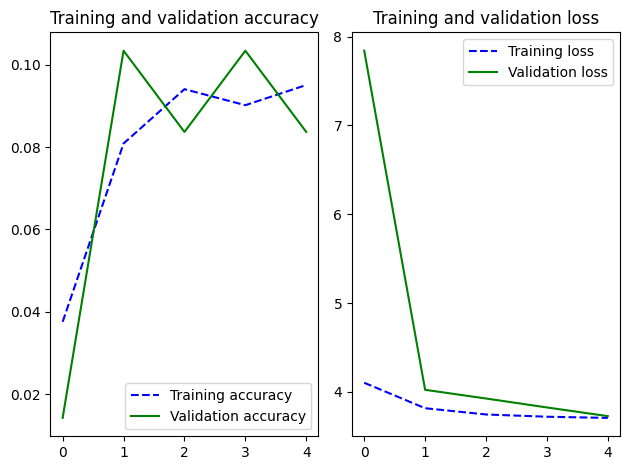

In [28]:
total_EN_history = {}
update_history(EN_history, total_EN_history)
plot_training_analysis(total_EN_history)

**Commentaire**: **Les résultats** actuels sont assez **faibles** (environ 10 %) lorsque l'ensemble du modèle est gelé. Cela pourrait être dû au fait que le modèle ne parvient pas à apprendre pleinement les caractéristiques de nos données. Nous allons **rouvrir** les couches pour voir si les résultats s'améliorent.

## 4.2 Fine tunning:

Nous avons choisi un taux d'apprentissage plus faible (5e-4) pour éviter de **modifier excessivement les poids** déjà appris du modèle EfficientNetB0, afin de conserver les **caractéristiques** apprises à partir du jeu de données **ImageNet**. Cela permet au modèle d'apprendre de nouvelles **caractéristiques** à partir de nos données sans perdre les **informations importantes** déjà acquises.

In [29]:
conv_base.trainable = True
EN.summary()

EN.compile(
    loss = 'categorical_crossentropy',
    optimizer = Adam(learning_rate=5e-4),
    metrics = ['accuracy']
)
EN_history = EN.fit(
    train_generator,
    epochs = 20,
    validation_data = valid_generator,
    callbacks=[reduce_lr]
)

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ efficientnetb0 (Functional)          │ (None, 7, 7, 1280)          │       4,049,571 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 62720)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 128)                 │       8,028,288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 128)                 │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 50)                  │           6,450 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 28,154,811 (107.40 MB)

 Trainable params: 12,042,542 (45.94 MB)

 Non-trainable params: 42,279 (165.16 KB)

 Optimizer params: 16,069,990 (61.30 MB)

Epoch 1/20
89/89 ━━━━━━━━━━━━━━━━━━━━ 201s 1s/step - accuracy: 0.1581 - loss: 3.9538 - val_accuracy: 0.1034 - val_loss: 4.5220 - learning_rate: 5.0000e-04
Epoch 2/20
89/89 ━━━━━━━━━━━━━━━━━━━━ 96s 1s/step - accuracy: 0.4462 - loss: 2.1972 - val_accuracy: 0.0142 - val_loss: 5.2710 - learning_rate: 5.0000e-04
Epoch 3/20
89/89 ━━━━━━━━━━━━━━━━━━━━ 97s 1s/step - accuracy: 0.6177 - loss: 1.4913 - val_accuracy: 0.0221 - val_loss: 5.5276 - learning_rate: 5.0000e-04
Epoch 4/20
89/89 ━━━━━━━━━━━━━━━━━━━━ 96s 1s/step - accuracy: 0.7325 - loss: 1.0253 - val_accuracy: 0.0229 - val_loss: 5.2488 - learning_rate: 1.0000e-04
Epoch 5/20
89/89 ━━━━━━━━━━━━━━━━━━━━ 98s 1s/step - accuracy: 0.7733 - loss: 0.9061 - val_accuracy: 0.0308 - val_loss: 5.0911 - learning_rate: 1.0000e-04
Epoch 6/20
89/89 ━━━━━━━━━━━━━━━━━━━━ 97s 1s/step - accuracy: 0.8095 - loss: 0.7761 - val_accuracy: 0.0947 - val_loss: 4.3430 - learning_rate: 2.0000e-05
Epoch 7/20
89/89 ━━━━━━━━━━━━━━━━━━━━ 96s 997ms/step - accuracy: 0.8173 - l

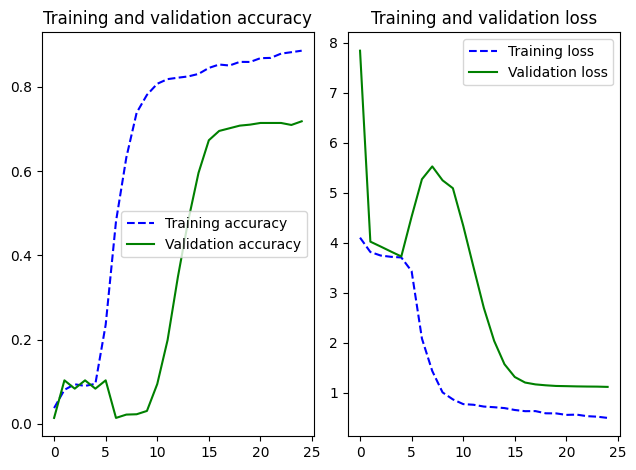

In [30]:
update_history(EN_history, total_EN_history)
plot_training_analysis(total_EN_history)

**Commentaire**: Les résultats dans cette partie sont plus prometteurs, avec une **validation accuracy** qui a augmenté à environ 71%. Cependant, bien que le phénomène de **surapprentissage (overfitting)** soit toujours présent, il a été réduit par rapport à l'approche avec un **CNN basique**, grâce à l'utilisation de **data augmentation** et de **dropout**.

## 4.3 Entraînement complet de EfficientNetB0:

Dans cette partie, nous avons construit et entraîné le modèle **EfficientNetB0** depuis le début, sans geler ses couches. Cela signifie que toutes les couches de **EfficientNetB0** sont entraînées en même temps que les couches additionnelles que nous avons ajoutées.

In [31]:
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, min_lr=1e-8)

conv_base = EfficientNetB0(
    weights='imagenet',
    include_top=False,
    input_shape=(img_width, img_height, 3)
)
EN_full = Sequential([
    Input(shape=(img_width, img_height, 3)),
    conv_base,
    Flatten(),
#    Dense(512, activation='relu', kernel_initializer='he_uniform'),
#    BatchNormalization(),
#    Dropout(0.5),
    Dense(128, activation='relu', kernel_initializer='he_uniform'),
    BatchNormalization(),
    Dropout(0.5),
    Dense(50, activation='softmax')
])
# conv_base.summary()
EN_full.summary()


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ efficientnetb0 (Functional)          │ (None, 7, 7, 1280)          │       4,049,571 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_2 (Flatten)                  │ (None, 62720)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 128)                 │       8,028,288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 128)                 │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 50)                  │           6,450 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,084,821 (46.10 MB)

 Trainable params: 12,042,542 (45.94 MB)

 Non-trainable params: 42,279 (165.16 KB)

Nous continuons d'utiliser **ReduceLROnPlateau** pour réduire le taux d'apprentissage lorsque la perte ne s'améliore pas, ce qui aide le modèle à converger plus efficacement. Le taux d'apprentissage initial est fixé à **1e-3**. Nous avons entraîné le modèle sur les ensembles de données d'entraînement et de validation pendant **20 époques**.

In [32]:
conv_base.trainable = True
EN_full.summary()

EN_full.compile(
    loss = 'categorical_crossentropy',
    optimizer = Adam(learning_rate=1e-3),
    metrics = ['accuracy']
)
EN_history_full = EN_full.fit(
    train_generator,
    epochs = 20,
    validation_data = valid_generator,
    callbacks=[reduce_lr]
)

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ efficientnetb0 (Functional)          │ (None, 7, 7, 1280)          │       4,049,571 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_2 (Flatten)                  │ (None, 62720)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 128)                 │       8,028,288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 128)                 │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 50)                  │           6,450 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,084,821 (46.10 MB)

 Trainable params: 12,042,542 (45.94 MB)

 Non-trainable params: 42,279 (165.16 KB)

Epoch 1/20
89/89 ━━━━━━━━━━━━━━━━━━━━ 184s 1s/step - accuracy: 0.1909 - loss: 3.7824 - val_accuracy: 0.0095 - val_loss: 8.6237 - learning_rate: 0.0010
Epoch 2/20
89/89 ━━━━━━━━━━━━━━━━━━━━ 97s 1s/step - accuracy: 0.5561 - loss: 1.7148 - val_accuracy: 0.0095 - val_loss: 4.1734 - learning_rate: 0.0010
Epoch 3/20
89/89 ━━━━━━━━━━━━━━━━━━━━ 96s 1s/step - accuracy: 0.6874 - loss: 1.2058 - val_accuracy: 0.0087 - val_loss: 4.5544 - learning_rate: 0.0010
Epoch 4/20
89/89 ━━━━━━━━━━━━━━━━━━━━ 96s 1s/step - accuracy: 0.7886 - loss: 0.7951 - val_accuracy: 0.0118 - val_loss: 5.0787 - learning_rate: 0.0010
Epoch 5/20
89/89 ━━━━━━━━━━━━━━━━━━━━ 96s 997ms/step - accuracy: 0.8617 - loss: 0.5384 - val_accuracy: 0.0253 - val_loss: 5.0781 - learning_rate: 2.0000e-04
Epoch 6/20
89/89 ━━━━━━━━━━━━━━━━━━━━ 97s 1s/step - accuracy: 0.8948 - loss: 0.4096 - val_accuracy: 0.0379 - val_loss: 5.2303 - learning_rate: 2.0000e-04
Epoch 7/20
89/89 ━━━━━━━━━━━━━━━━━━━━ 96s 1s/step - accuracy: 0.9122 - loss: 0.3491 - va

20/20 ━━━━━━━━━━━━━━━━━━━━ 11s 548ms/step - accuracy: 0.7753 - loss: 0.8050
Test accuracy: 0.7861089110374451


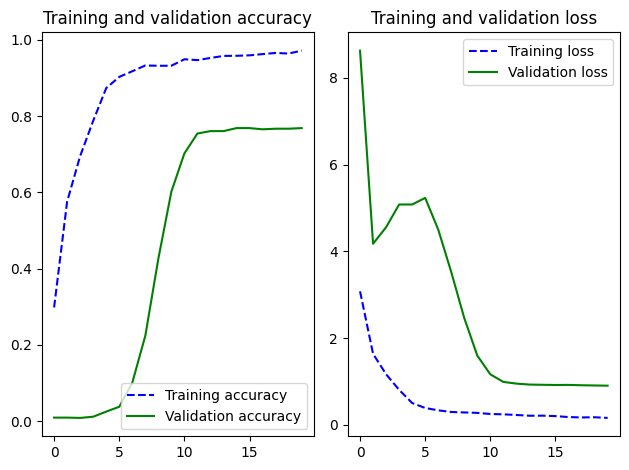

In [61]:
test_loss, test_accuracy = EN_full.evaluate(test_generator)
print(f"Test accuracy: {test_accuracy}")
total_EN_history_full = {}
update_history(EN_history_full, total_EN_history_full)
plot_training_analysis(total_EN_history_full)

**Commentaire:**
Les résultats obtenus en ouvrant toutes les couches dès le début sont meilleurs (environ 79%). Ce résultat dépasse celui de l'approche précédente, probablement en raison du fait que l'entraînement initial avec des couches gelées suivi d'une réouverture progressive peut conduire le modèle à tomber dans un **minimum local**. Cependant, le phénomène de surapprentissage (overfitting) persiste au vu de l'écart entre les 2 courbes.

## 4.4 Résultat:

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


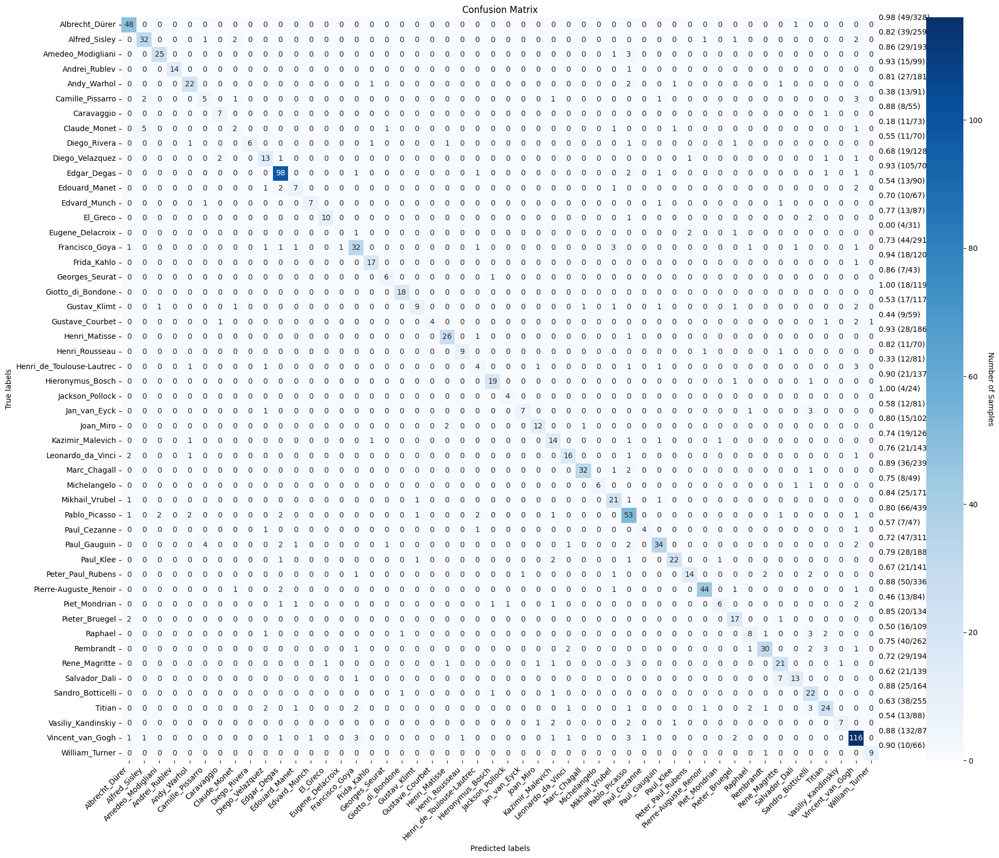

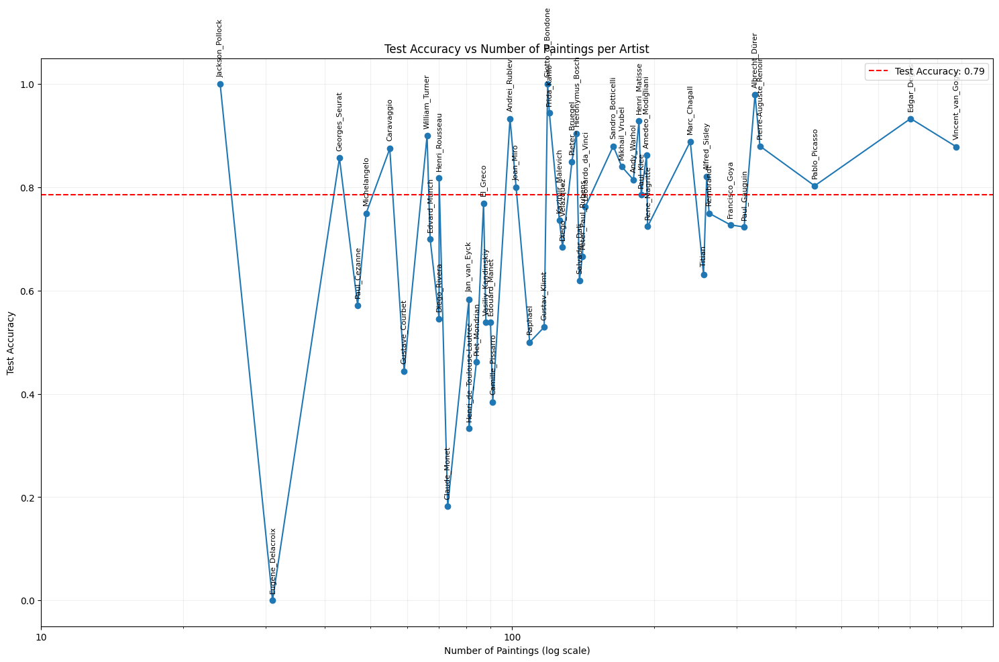

In [63]:
# predictions por images du test dataset
all_predictions = []
all_true_labels = []
all_images = []

for i in range(len(test_generator)):
    images, labels = next(test_generator)
    predictions = EN_full.predict(images)
    all_predictions.extend(predictions)
    all_true_labels.extend(labels)
    all_images.extend(images)

all_predictions = np.array(all_predictions)
all_true_labels = np.array(all_true_labels)
all_images = np.array(all_images)

predicted_classes = np.argmax(all_predictions, axis=1)
true_classes = np.argmax(all_true_labels, axis=1)

author_names = list(test_generator.class_indices.keys())

# confusion matrix
cm = confusion_matrix(true_classes, predicted_classes)

#  accuracy 
author_accuracy = cm.diagonal() / cm.sum(axis=1)

# Get the number of images tested 
test_image_counts = cm.sum(axis=1)

# Get the total number of images 
total_image_counts = df_hq['class'].value_counts().sort_index().values

# heatmap for confusion matrix
plt.figure(figsize=(20, 16))
ax = sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=author_names, yticklabels=author_names)

cbar = ax.collections[0].colorbar
cbar.set_label('Number of Samples', rotation=270, labelpad=15)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)

for i, (accuracy, test_count, total_count) in enumerate(zip(author_accuracy, test_image_counts, total_image_counts)):
    plt.text(len(author_names), i, f'{accuracy:.2f} ({test_count}/{total_count})', ha='left', va='center')

plt.tight_layout()
plt.show()

df_accuracy = pd.DataFrame({
    'Artist': author_names,
    'Accuracy': author_accuracy,
    'Total Images': total_image_counts
})

# Tri
df_accuracy = df_accuracy.sort_values('Total Images', ascending=True)

fig, ax1 = plt.subplots(figsize=(15, 10))


ax1.plot(df_accuracy['Total Images'], df_accuracy['Accuracy'], marker='o')

ax1.set_xlabel('Number of Paintings (log scale)')
ax1.set_ylabel('Test Accuracy')
ax1.set_title('Test Accuracy vs Number of Paintings per Artist')
ax1.set_xscale('log')
min_images = df_accuracy['Total Images'].min()
max_images = df_accuracy['Total Images'].max()
x_ticks = [10**i for i in range(int(np.log10(min_images)), int(np.log10(max_images))+1)]
ax1.set_xticks(x_ticks)
ax1.set_xticklabels(x_ticks)


for i, row in df_accuracy.iterrows():
    ax1.annotate(row['Artist'], (row['Total Images'], row['Accuracy']),
                 textcoords="offset points", xytext=(0,10), ha='center', rotation=90, fontsize=8)


ax1.grid(True, which="both", ls="-", alpha=0.2)
ax1.axhline(y=test_accuracy, color='red', linestyle='--', label=f'Test Accuracy: {test_accuracy:.2f}')
ax1.legend()
plt.tight_layout()
plt.show()

**Commentaire:**
Dans cette méthode, le taux de précision pour chaque artiste dépend toujours du nombre de tableaux, mais il s'est considérablement amélioré. Cela peut être expliqué par l'utilisation d'un modèle CNN plus profond **(EfficientNetB0)**, capable d'apprendre des caractéristiques complexes des images. Ce modèle est plus performant pour distinguer les styles de peinture.

Nous affichons aléatoirement 9 images à partir de l'ensemble de données de test pour comparer les résultats:

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


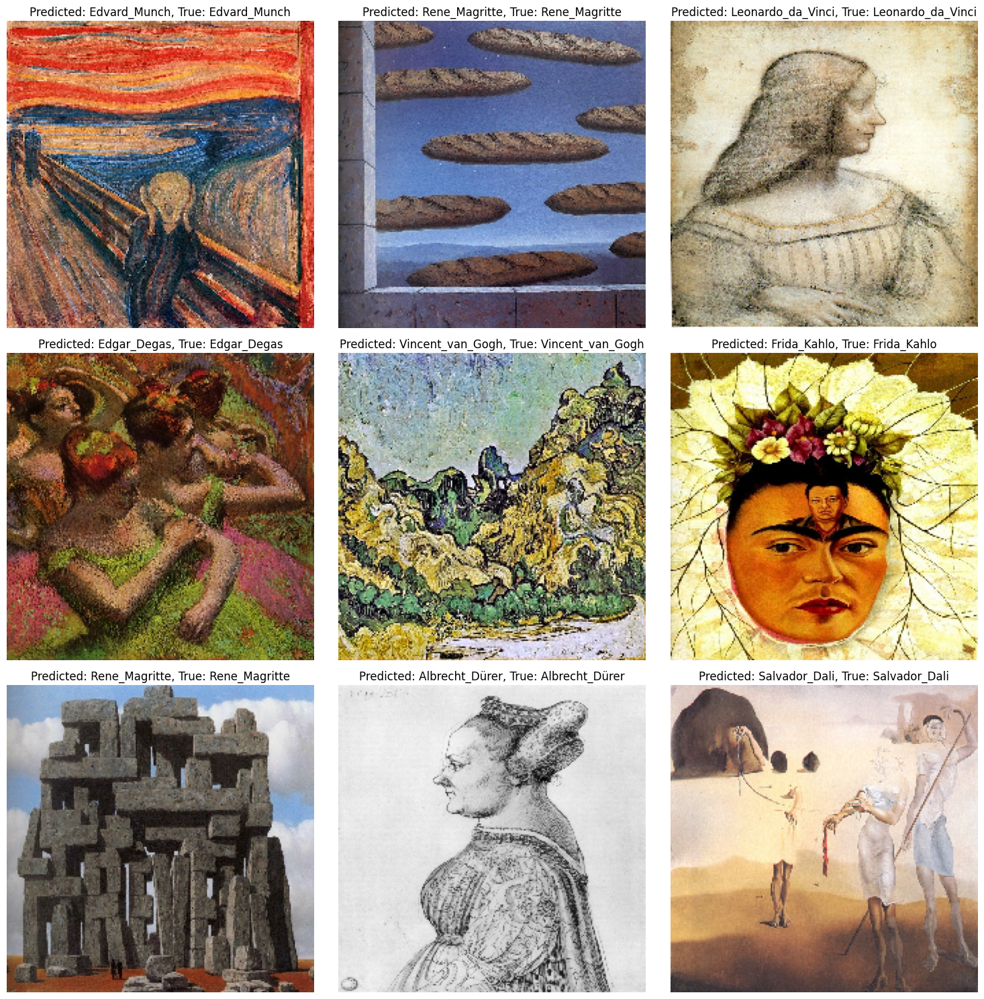

In [40]:
images, labels = next(test_generator)

predictions = EN_full.predict(images)

class_names = list(test_generator.class_indices.keys())

# Selectionne 9 images 
plt.figure(figsize=(15, 15))
for i in range(9): 
    plt.subplot(3, 3, i + 1)
    plt.imshow(images[i])
    predicted_label = np.argmax(predictions[i])
    true_label = np.argmax(labels[i])
    plt.title(f"Predicted: {class_names[predicted_label]}, True: {class_names[true_label]}")
    plt.axis('off')

plt.tight_layout()
plt.show()


**Les résultats ont l'air bien mieux qu'au début du projet !**

# 5. Test sur les Images à Résolution Basse (LQ)

Passons maintenant aux images en basse qualité pour comparer les résultats.

In [44]:
df_lq = pd.DataFrame({
    'filename': image_lq_paths,
    
    'class': [list(artist_lq_label_mapping.keys())[list(artist_lq_label_mapping.values()).index(label_lq)] for label_lq in labels_lq]
})

test_datagen_lq = ImageDataGenerator(rescale=1./255)

# generator pour LQ dataset
lq_generator = test_datagen_lq.flow_from_dataframe(
    df_lq,
    x_col='filename',  
    y_col='class',     
    target_size=img_size,  
    batch_size=65,    
    class_mode='categorical',  
    shuffle=True      
)

# Evaluation
lq_loss, lq_accuracy = EN_full.evaluate(lq_generator)

print(f"Loss on LQ dataset: {lq_loss}")
print(f"Accuracy on LQ dataset: {lq_accuracy}")


Found 8355 validated image filenames belonging to 50 classes.


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


125/125 ━━━━━━━━━━━━━━━━━━━━ 36s 287ms/step - accuracy: 0.9278 - loss: 0.2895
Loss on LQ dataset: 0.2909839451313019
Accuracy on LQ dataset: 0.9266307353973389


**Commentaire :**

La précision sur le jeu de données **faible qualité** est assez élevée, atteignant **92 %**, ce qui prouve que le modèle est capable de faire de bonnes prédictions sur des images de **faible qualité**. Cependant, ce taux élevé peut en partie être expliqué par le fait que la **version haute qualité** des images de **faible qualité** a été utilisée pour entraîner le modèle, ce qui a permis au modèle d'apprendre les caractéristiques des images **haute qualité** et de les appliquer efficacement aux images **faible qualité**.

Nous affichons aléatoirement 9 images à partir de l'ensemble de données de test pour comparer les résultats:

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


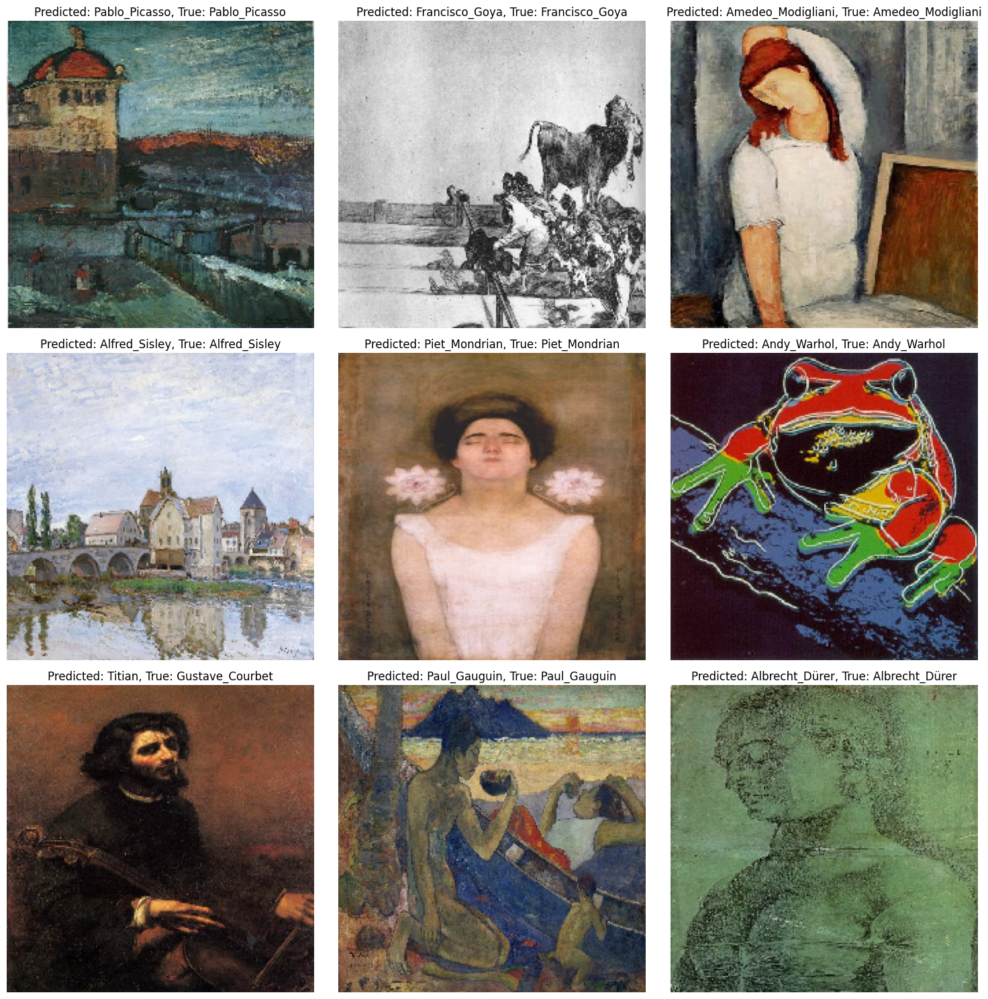

In [43]:

images, labels = next(lq_generator)

predictions = EN_full.predict(images)


class_names = list(lq_generator.class_indices.keys())


plt.figure(figsize=(15, 15))
for i in range(9):  
    plt.subplot(3, 3, i + 1)
    plt.imshow(images[i])
    predicted_label = np.argmax(predictions[i])
    true_label = np.argmax(labels[i])
    plt.title(f"Predicted: {class_names[predicted_label]}, True: {class_names[true_label]}")
    plt.axis('off')
plt.tight_layout()
plt.show()

# 6. Conclusion:

L'analyse de ce projet nous a amené à plusieurs conclusions que nous listons comme suit :
- **Augmentation des données** et le **dropout** ont contribué à réduire l'overfitting même si cela n'a pas résolu complètement le problème. Le modèle pourrait être testé sur d'autres ensembles de données pour évaluer sa capacité à se généraliser encore plus à des contextes différents et ainsi tester à nouveau sa robustesse.

- L'**Over-sampling** a permis d'équilibrer les prédictions des auteurs réduisant ainsi la dépendance du modèle au nombre d'images par auteur. Il a aussi contribué  à améliorer un peu la **précision**.

- Le modèle, qui a été entraîné sur des images **haute qualité**, a montré de bonnes performances sur les images **faible qualité**.

- Le **fine-tuning** du modèle **EfficientNetB0** pré-entraîné sur **ImageNet** a nettement amélioré la précision du modèle. Une comparaison avec d'autres architectures plus complexes (par exemple, ResNet ou DenseNet) pourrait permettre de déterminer si l'architecture EfficientNetB0 est optimale pour ce type de tâche.

In fine, ce projet nous a appris qu'à l'avenir, une évaluation continue sur différentes phases du projet comme l'entraînement la validation et les tests finaux est nécessaire pour ajuster les paramètres et s'assurer que le modèle est robuste et généralisable. 

Merci pour votre lecture.